In [ ]:
## 2026.06.22 Terminal CLI: code/Xenium_lung/Lung_train_validate_cv_UNIlabel.py
##   python -u code/Xenium_lung/Lung_train_validate_cv_UNIlabel.py --sample VUILD107MA
##   python -u code/Xenium_lung/Lung_train_validate_cv_UNIlabel.py --cases-set complete
##   h5ad pre-build: code/Xenium_lung/transer_embedding_label_h5ad.py
## 2026.02.11 using FineST env
## 2026.02.12 vilization cell type of each ROI
## 2026.03.04 woody_pro:: upload the HE-StarDist embedding and predict the cell type of NCRT_tumor1  
## 2026.03.06 woody_pro:: clearn code 
## 2026.03.13 update cell type level1: nanually make codex_meta_celltype_level1.csv 
## 2026.03.16 use valis to make registration [dont try]
## 2026.03.18 delete two subtypes, adjust scale factor by batch
## 2026.03.19 Train and using NCRT_train.ipynb
## 2026.03.23 Adjust file name and path, then adjust model to use level1 and level2, make model_train_validate.ipynb
## 2026.04.04 woody_pro: SeededNTM; make processing for x, add cv in training for tumor1
## 2026.04.06 Adjust loss function
## 2026.04.14 LLY update using UNI method, based on LOGO CV
## 2026.05.11 Use codex_meta_celltype_level012.csv, run Data_process_visualization.ipynb and demo_level012.sh, 
##            to get he_cell_coords/ and matched_features_tumor1_level012.npz
## 2026.05.11 add the prediction form Level1 directly
## 2026.05.21 copy form NCRT_train_validate_tumor1_cv_UNIlabel012.ipynb, adjust the code for Xenium data
## 2026.05.22 make the code clean, add the StarDist prediction, and adjust the code for Xenium data
## 2026.06.24 train and test model on all Compelete_Cases, discovery on Incomplete_Cases
## 2026.07.25 Copy from Xenium_lung/Lung_train_validate_cv_UNIlabel.ipynb, adjust the code for HCC data

In [35]:
import os
# Pin to ONE physical GPU before any torch import (restart kernel after changing).
# Physical GPU index on this machine (default 2). Override without editing notebook:
#   export NCRT_CUDA_DEVICE=0
# Or set CUDA_VISIBLE_DEVICES yourself before starting Jupyter (then this block is skipped).
if "CUDA_VISIBLE_DEVICES" not in os.environ:
    os.environ["CUDA_VISIBLE_DEVICES"] = os.environ.get("NCRT_CUDA_DEVICE", "0")
NCRT_PHYSICAL_GPU = os.environ["CUDA_VISIBLE_DEVICES"].split(",")[0].strip()

# Before other imports: PyTorch/torch.distributed may use /tmp; set NCRT_TMPDIR if quota is tight.
_nrtc_tmp = os.environ.get("NCRT_TMPDIR", os.path.join(os.path.expanduser("~"), "ssd2", "tmp"))
try:
    os.makedirs(_nrtc_tmp, exist_ok=True)
    os.environ["TMPDIR"] = _nrtc_tmp
    os.environ["TEMP"] = _nrtc_tmp
    os.environ["TMP"] = _nrtc_tmp
    import tempfile as _tf_nb
    _tf_nb.tempdir = _nrtc_tmp
except OSError:
    pass

import sys
import importlib
import pandas as pd
from pathlib import Path

## Add the code directory to Python path
path = '/home/lingyu/ssd2/Python/'
code_dir = f'{path}Collaborate/esccAI/code/Hist2Pheno_pkg/'
if code_dir not in sys.path:
    sys.path.insert(0, code_dir)

_xenium_lung_dir = f'{path}Collaborate/esccAI/code/Xenium_lung/'
if _xenium_lung_dir not in sys.path:
    sys.path.insert(0, _xenium_lung_dir)

## Import (or reload) base module
# Do NOT `import model` — that binds the name ``model`` to the *module* and will shadow
# your trained ``torch.nn.Module`` after ``globals().update(LP)`` when this cell is re-run.
import base
import plot
import model as model_pkg
## Impost：Force reload base.py
importlib.reload(base)
importlib.reload(plot)
importlib.reload(model_pkg)

import xenium_uni_nb_helpers as uni_nb
importlib.reload(uni_nb)
from xenium_uni_nb_helpers import (
    ensure_lp_extra_insample_preds,
    stardist_head_preds,
    plot_he_confusion_matrices,
    plot_he_spatial_extra_tiers,
    plot_he_f1_extra_tiers,
    build_insample_tier_metrics,
    build_stardist_matched_tier_metrics,
    save_stardist_external_validation_metrics,
    plot_stardist_roc_from_auroc_csv,
    _auroc_csv_path_from_metrics,
    plot_stardist_spatial_extra,
    plot_stardist_acc_extra,
    plot_stardist_confusion_extra,
    plot_stardist_f1_extra,
    plot_stardist_roc_extra,
)

## Re-import the function (otherwise, still be old_version).
from base import (
    get_celltype_coords,
    divide_into_rois_by_parent,
    get_pixel_size,
    visualize_roi_cells,
    visualize_all_rois_with_he,
    visualize_all_rois,
    extract_and_save_celltype_by_tumorid,
    transformation_matrix_properties,
    invert_transformation_matrix,
    align_pcf_to_he_coordinates,
    add_pixel_coords,
    verify_transformation_alignment,
    merge_coordinates,
    analyze_and_filter_classes_by_gap,
    ImprovedMLPClassifier,
    load_embeddings,
    match_embeddings,
    prepare_matched_embeddings,
    evaluate,
    create_dataloaders,
    train_model,
    CellTypeDataset,
    evaluate_and_plot_on_all_data,
    align_matrix,
    match_StarCoords2ROI,
    match_celltype2stardist,
    merge_celltype_level12,
    make_PCF2HE_alignment,
    load_cell_pixcoords,load_hist_embeddings,
    match_hist2cell_matrix,
    match_hist2cell_h5ad,
    load_matched_h5ad,
    prepare_data_from_matched_h5ad,
    adata_X_to_dense,
    load_matched_features_bundle,
    encode_labels_with_class_names,
    matched_features_npz_to_h5ad,
    make_PCF2HE2StarDist_alignment,
    save_hce_validation_metrics,
    collect_hce_tier_metrics_extras,
    split_train_test,
    prepare_data_leave_one_group_out,
    spatial_tile_groups_for_logo,
    loader_train_test,
    first_pth_tensor
    
)

from plot import (
    plot_celltype_distribution,
    visualize_all_celltype_distributions,
    plot_celltype_distribution,
    plot_celltype_spatial_distribution,
    plot_PCF_HE_counts,
    plot_WSI_counts,
    plot_cell_area_histogram,
    plot_confusion_matrix,
    plot_level1_spatial_distribution,
    plot_tier_spatial_distribution,
    plot_per_class_f1,
    plot_per_class_accuracy,
    plot_level1_accuracy_from_level2_predictions,
    mlp_collect_softmax_probs,
    mlp_collect_five_head_softmax_probs,
    plot_multiclass_roc_curves,
    plot_level1_roc_from_level2_scores,
    plot_level1_f1_from_level2_predictions,
    plot_level1_accuracy_from_level1_head,
    plot_level1_f1_from_level1_head,
    plot_level1_roc_from_level1_head
)

from model import (
    build_mlp_classifier,
    get_best_checkpoint_path,
    get_select4_best_checkpoint_path,
    sync_best_mlp_from_logo_fold,
    train_and_save_model,
    infer_input_dim_and_num_classes,
    mode_validation,
    load_model_for_predict,
    train_and_save_model_from_split,
    mode_validation_from_split,
    train_hce_leave_one_group_out_cv,
    run_logo_cv_and_load_best_model,
    report_logo_cv_means_and_insample_eval,
    run_logo_cv_with_insample_report,
    run_stratified_kfold_cv_with_insample_report,
    predict_all_label_heads,
)

## Import HAS_OPENSLIDE and HAS_TIFFFILE from base module for use in notebook
HAS_OPENSLIDE = base.HAS_OPENSLIDE
HAS_TIFFFILE = base.HAS_TIFFFILE

## Also import openslide module if available (needed for direct use in some cells)
if HAS_OPENSLIDE:
    import openslide
else:
    openslide = None

try:
    import tifffile
except ImportError:
    tifffile = None

print("Successfully reloaded functions from base.py")
print(f"openslide: {HAS_OPENSLIDE}, tifffile: {HAS_TIFFFILE}")
print(f"CUDA_VISIBLE_DEVICES={os.environ.get('CUDA_VISIBLE_DEVICES')} (physical GPU {NCRT_PHYSICAL_GPU})")


Successfully reloaded functions from base.py
openslide: False, tifffile: True
CUDA_VISIBLE_DEVICES=0 (physical GPU 0)


In [3]:
## Set the path
os.chdir(f'{path}Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases')   
therapy_data = 'VUILD107MA'
therapy_model = f'{therapy_data}_project_all_UNI'
save_result = 'result'
stardist_data = 'StarDist_Segment'

## Terminal equivalent:
##   python -u code/Xenium_lung/Lung_train_validate_cv_UNIlabel.py --sample VUILD107MA
##   python -u code/Xenium_lung/Lung_train_validate_cv_UNIlabel.py --cases-set complete


In [4]:
## Result figures: name → filename under .../{therapy_model}/result (pass key to plot save_path)
from xenium_uni_nb_helpers import LUNG_FIG, make_result_fig

SELECT4_ROOT = (
    f"{path}Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/"
    f"Spatial-PF-Processed/Data/Complete_Cases"
)
_result_dir = f"{SELECT4_ROOT}/{therapy_data}/{therapy_model}/{save_result}"
FIG = LUNG_FIG
result_fig, _result_dir_path = make_result_fig(SELECT4_ROOT, therapy_data, therapy_model, save_result)


In [5]:
## CUDA/CPU sanity check for training setup
import os
import sys
import torch

# After Cell 1, only one physical GPU is visible to this process as logical cuda:0.
PHYSICAL_GPU = os.environ.get("CUDA_VISIBLE_DEVICES", os.environ.get("NCRT_CUDA_DEVICE", "2"))
TORCH_CUDA_INDEX = 0

print(sys.executable)
print(
    f"torch {torch.__version__} | built with CUDA: {torch.version.cuda} | "
    f"cuda.is_available: {torch.cuda.is_available()}"
)
print(f"CUDA_VISIBLE_DEVICES={os.environ.get('CUDA_VISIBLE_DEVICES')!r} -> physical GPU(s) {PHYSICAL_GPU!r}")

if torch.cuda.is_available():
    n_gpu = torch.cuda.device_count()
    if n_gpu != 1:
        print(
            f"WARNING: expected 1 visible GPU after CUDA_VISIBLE_DEVICES mask, saw {n_gpu}. "
            "Restart kernel and run Cell 1 before this cell."
        )
    torch.cuda.set_device(TORCH_CUDA_INDEX)
    device = torch.device(f"cuda:{TORCH_CUDA_INDEX}")
    # Backward-compatible alias used in some printouts / downstream code.
    CUDA_DEVICE_INDEX = TORCH_CUDA_INDEX
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    amp_scaler = torch.amp.GradScaler("cuda")
    print(
        f"Using physical GPU {PHYSICAL_GPU} as logical cuda:{TORCH_CUDA_INDEX} | "
        f"{torch.cuda.get_device_name(TORCH_CUDA_INDEX)}"
    )
else:
    CUDA_DEVICE_INDEX = None
    allow_cpu = os.environ.get("NCRT_ALLOW_CPU_TRAIN", "").strip().lower() in ("1", "true", "yes")
    if allow_cpu:
        device, amp_scaler = torch.device("cpu"), None
        print("WARNING: CUDA unavailable, training on CPU (set NCRT_ALLOW_CPU_TRAIN=1).")
    else:
        raise RuntimeError(
            "CUDA unavailable. Please use a CUDA-enabled PyTorch build, "
            "or set NCRT_ALLOW_CPU_TRAIN=1 to run on CPU."
        )

if device.type == "cuda":
    print(f"device: {device} | physical GPU {PHYSICAL_GPU} | {torch.cuda.get_device_name(TORCH_CUDA_INDEX)}")
else:
    print(f"device: {device}")



## Reproducibility setup (run this first after kernel restart)
import random
import numpy as np

SEED = 42
os.environ["PYTHONHASHSEED"] = str(SEED)
os.environ["CUBLAS_WORKSPACE_CONFIG"] = ":4096:8"

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed(SEED)

torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
torch.use_deterministic_algorithms(True)

print(f"Reproducibility configured with SEED={SEED}")


/ssd2/users/lingyu/conda_envs/SeededNTM/bin/python
torch 2.9.1+cu130 | built with CUDA: 13.0 | cuda.is_available: True
CUDA_VISIBLE_DEVICES='0' -> physical GPU(s) '0'
Using physical GPU 0 as logical cuda:0 | NVIDIA RTX PRO 6000 Blackwell Server Edition
device: cuda:0 | physical GPU 0 | NVIDIA RTX PRO 6000 Blackwell Server Edition
Reproducibility configured with SEED=42


In [6]:
hist_embedding_dir = Path(f'{path}Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/{therapy_data}/{therapy_model}/ImgEmbeddings_all/sc_pth_16_16')
print(hist_embedding_dir)
tensor = first_pth_tensor(hist_embedding_dir)

/home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/ImgEmbeddings_all/sc_pth_16_16
Found file: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/ImgEmbeddings_all/sc_pth_16_16/VUILD107MA_10007.541015624987_1455.9210205078118.pth
Loaded type: <class 'tuple'>
tensor.shape of the first .pth file: torch.Size([1, 1, 1024])


/home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/ImgEmbeddings_all/sc_pth_16_16

Loaded type: <class 'tuple'>

tensor.shape of the first .pth file: torch.Size([1, 1, 1024])

## Cell Type Classification Model

Leave-one-group-out (LOGO) CV (sklearn `LeaveOneGroupOut` idea).  
Uses npz `matched_features_tumor1_logo.npz` with a `TumorID` column when available. If that column is constant for all rows (typical for tumor1-only CSV), the notebook **falls back to spatial tiles** on `X_pix_HE`×`Y_pix_HE` (`spatial_tile_groups_for_logo`).

In [7]:
## Match embeddings → standard AnnData (.h5ad)
cell_coords_path = f'{path}Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/{therapy_data}/{therapy_data}_cells_partitioned_by_annotation_sample_match_with_pixel.csv'
hist_embedding_dir = Path(f'{path}Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/{therapy_data}/{therapy_model}/ImgEmbeddings_all/sc_pth_16_16')
matched_h5ad_path = f'{path}Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/{therapy_data}/{therapy_data}_matched_features.h5ad'

## Optional one-time migration from legacy npz:
# matched_features_npz_to_h5ad(
#     f'{path}Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/{therapy_data}/{therapy_data}_matched_features.npz',
#     cell_coords_path,
#     matched_h5ad_path,
# )

column_rename = base.XENIUM_CELL_COORD_COLUMN_RENAME_FULL
match_tolerance = 1.0

adata = match_hist2cell_h5ad(
    cell_coords_path=cell_coords_path,
    hist_embedding_dir=hist_embedding_dir,
    matched_h5ad_path=matched_h5ad_path,
    coord_cols=('X_pix_HE', 'Y_pix_HE'),
    tolerance=match_tolerance,
    pth_prefix=therapy_data,
    column_rename=column_rename,
    auto_rename=False,
)
print(adata)
print('obs columns:', list(adata.obs.columns))
print('obsm keys:', list(adata.obsm.keys()))


  ✓ matched h5ad cache found; loading /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_matched_features.h5ad
  ✓ Loaded h5ad: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_matched_features.h5ad (30,615 cells × 1024 features)
AnnData object with n_obs × n_vars = 30615 × 1024
    obs: 'CNiche', 'TNiche', 'final_CT', 'final_lineage', 'final_sublineage', 'tma'
    uns: 'cell_coords_path', 'embedding_dim', 'matched_n_cells'
    obsm: 'spatial', 'spatial_HE'
obs columns: ['CNiche', 'TNiche', 'final_CT', 'final_lineage', 'final_sublineage', 'tma']
obsm keys: ['spatial', 'spatial_HE']


In [8]:
# Prep CV arrays from matched h5ad (obs labels + obsm coordinates already aligned).
from sklearn.preprocessing import StandardScaler

cv_data = prepare_data_from_matched_h5ad(
    adata,
    groups=np.arange(adata.n_obs, dtype=np.int64),
)
USE_FIVE_HEAD = all(
    c in adata.obs.columns
    for c in ("final_sublineage", "CNiche", "TNiche")
)
if USE_FIVE_HEAD:
    print(
        "Five-head training: L2=final_CT, L1=final_lineage, L12=final_sublineage, L3=CNiche, L4=TNiche"
    )

class_names = cv_data["class_names"]
class_names_level1 = cv_data["class_names_level1"]
class_names_level12 = cv_data.get("class_names_level12")
class_names_level3 = cv_data.get("class_names_level3")
class_names_level4 = cv_data.get("class_names_level4")
le_level2 = cv_data["le_level2"]
le_level1 = cv_data["le_level1"]

scaler = StandardScaler()
scaler.fit(cv_data["X_f"])
X_coords_plot = cv_data.get("X_coords_f")

# Backward-compatible names for downstream cells
X = adata_X_to_dense(adata.X)
y = adata.obs["final_CT"].to_numpy()
y_level1 = adata.obs["final_lineage"].to_numpy()
y_level12 = adata.obs["final_sublineage"].to_numpy()
y_level3 = adata.obs["CNiche"].to_numpy()
y_level4 = adata.obs["TNiche"].to_numpy()
X_coords_matched = adata.obsm["spatial_HE"]
matched_features_path = matched_h5ad_path

RUN_RANDOM_TRAIN_TEST_SPLIT = False
if RUN_RANDOM_TRAIN_TEST_SPLIT:
    result = split_train_test(X, y, y_level1)
else:
    result = None



Leave-one-group-out prep (filtered data):
  Samples: 30614, features: 1024
  Level2 classes: 44
  Level1 classes: 4
  Level12 classes: 6
  Level3 (CNiche) classes: 12
  Level4 (TNiche) classes: 12
  Coordinates: (30614, 2)
  Groups (for LOGO): 30614 unique
Five-head training: L2=final_CT, L1=final_lineage, L12=final_sublineage, L3=CNiche, L4=TNiche


In [9]:
# CV fold loaders are built per ablation run; encoded labels come from cv_data (h5ad prep).
loaders = None
train_loader = val_loader = val_loader_eval = None
train_dataset = val_dataset = None
X_train_scaled = y_train_encoded = y_test_encoded = None
y_train_level1_encoded = y_test_level1_encoded = None
y_encoded_f = cv_data["y_encoded_f"]
y_level1_encoded_f = cv_data["y_level1_encoded_f"]


In [10]:
## see matched h5ad
adata = load_matched_h5ad(matched_h5ad_path)
print(adata)
print(adata.obs_names[:3], adata.var_names[:3])
print(adata.obs.columns, list(adata.obsm.keys()))

  ✓ Loaded h5ad: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_matched_features.h5ad (30,615 cells × 1024 features)
AnnData object with n_obs × n_vars = 30615 × 1024
    obs: 'CNiche', 'TNiche', 'final_CT', 'final_lineage', 'final_sublineage', 'tma'
    uns: 'cell_coords_path', 'embedding_dim', 'matched_n_cells'
    obsm: 'spatial', 'spatial_HE'
Index(['aaaaaaab-1', 'aaaaaaac-1', 'aaaaaaad-1'], dtype='object') Index(['1', '2', '3'], dtype='object')
Index(['CNiche', 'TNiche', 'final_CT', 'final_lineage', 'final_sublineage',
       'tma'],
      dtype='object') ['spatial', 'spatial_HE']


## MLP classifier

In [11]:
# Ablation: unified HCE weights under stratified_kfold CV
import os
import shutil
import pandas as pd

KFOLD_RESUME_FROM_CHECKPOINTS = True  # False=每个配置都重新训练；True/None=按已有 fold checkpoint 复用
AB_PATIENCE = 10
AB_MAX_EPOCHS = 50
AB_HIDDEN_DIMS = (1024, 512, 256)    # Model default
AB_CV_K = 5
AB_STRATIFY_TARGET = "joint"  # choices: level2 / level1 / joint

ABLATION_CONFIGS = [
    # {"tag": "B_equal", "hce_w1": 1.0, "hce_w2": 1.0, "hce_w12": 1.0},
    # {"tag": "C_emph_L1", "hce_w1": 2.0, "hce_w2": 1.0, "hce_w12": 1.0},
    {"tag": "D_emph_L2", "hce_w1": 1.0, "hce_w2": 2.0, "hce_w12": 1.0,
     "hce_w_l12head": 1.0, "hce_w_l3": 1.0, "hce_w_l4": 1.0},
    # {"tag": "E_emph_agg", "hce_w1": 1.0, "hce_w2": 1.0, "hce_w12": 2.0},
]

ablation_runs = {}
rows = []

for cfg in ABLATION_CONFIGS:
    tag = cfg["tag"]

    ckpt_dir = os.path.join(
        SELECT4_ROOT, therapy_data, therapy_model, "ablation_kfold_ckpts", tag
    )

    print("\n" + "=" * 80)
    print(f"[Ablation][stratified_kfold] Running: {tag}")
    print("=" * 80)

    LP_i = run_stratified_kfold_cv_with_insample_report(
        device=device,
        cv_data=cv_data,
        scaler=scaler,
        class_names=class_names,
        evaluate=evaluate,
        path=path,
        therapy_data=therapy_data,
        therapy_model=therapy_model,
        hce_w1=cfg["hce_w1"],
        hce_w2=cfg["hce_w2"],
        hce_w12=cfg["hce_w12"],
        hce_w_l12head=cfg.get("hce_w_l12head", 1.0),
        hce_w_l3=cfg.get("hce_w_l3", 1.0),
        hce_w_l4=cfg.get("hce_w_l4", 1.0),
        n_splits=AB_CV_K,
        stratify_target=AB_STRATIFY_TARGET,
        patience=AB_PATIENCE,
        max_epochs=AB_MAX_EPOCHS,
        loader_kwargs={"seed": SEED, "train_balance_sampler": False},
        resume_from_checkpoints=KFOLD_RESUME_FROM_CHECKPOINTS,
        kfold_checkpoint_dir=ckpt_dir,
        hidden_dims=AB_HIDDEN_DIMS,
    )

    ablation_runs[tag] = LP_i
    score_l4 = float(
        LP_i["val_macro_f1"]
        + LP_i["val_weighted_f1"]
        + LP_i["val_level1_macro_f1"]
        + LP_i["val_level1_weighted_f1"]
    )
    rows.append(
        {
            "tag": tag,
            "hce_w1": cfg["hce_w1"],
            "hce_w2": cfg["hce_w2"],
            "hce_w12": cfg["hce_w12"],
            "hidden_dims": str(AB_HIDDEN_DIMS),
            "l2_acc": float(LP_i["val_acc"]),
            "l2_macro_f1": float(LP_i["val_macro_f1"]),
            "l2_weighted_f1": float(LP_i["val_weighted_f1"]),
            "l1_acc": float(LP_i["val_level1_acc"]),
            "l1_macro_f1": float(LP_i["val_level1_macro_f1"]),
            "l1_weighted_f1": float(LP_i["val_level1_weighted_f1"]),
            "best_epoch": int(LP_i["best_epoch"]),
            "l4_kfold_select_score": score_l4,
        }
    )

AB_SUMMARY_DF = (
    pd.DataFrame(rows)
    .sort_values("l4_kfold_select_score", ascending=False)
    .reset_index(drop=True)
)
print("\nAblation summary (sorted by l4_kfold_select_score = L2/L1 macro+weighted):")
display(AB_SUMMARY_DF)

best_tag = AB_SUMMARY_DF.iloc[0]["tag"]
LP = ablation_runs[best_tag]

best_idx = AB_SUMMARY_DF["l4_kfold_select_score"].astype(float).idxmax()
assert AB_SUMMARY_DF.iloc[best_idx]["tag"] == best_tag

best_cfg = next(c for c in ABLATION_CONFIGS if c["tag"] == best_tag)
best_fold = LP["best_fold"]
best_fold_4term_score = float(
    best_fold["l2_macro_f1"]
    + best_fold["l2_weighted_f1"]
    + best_fold["l1_macro_f1"]
    + best_fold["l1_weighted_f1"]
)

print(f"Selected best config by l4_kfold_select_score: {best_tag}")
print(
    "  Best weights: "
    f"hce_w1={best_cfg['hce_w1']}, hce_w2={best_cfg['hce_w2']}, hce_w12={best_cfg['hce_w12']}"
)
print(
    "  Best fold checkpoint in selected config: "
    f"fold={best_fold['fold']}, 4-term score={best_fold_4term_score:.4f}, path={best_fold['checkpoint']}"
)

# Sync best fold → best_mlp_gpu.pt under Select4 (same tree as kfold writes)
BEST_MLP_CHECKPOINT = sync_best_mlp_from_logo_fold(
    path,
    therapy_data,
    therapy_model,
    best_fold["checkpoint"],
    dest_path=get_select4_best_checkpoint_path(path, therapy_data, therapy_model),
)
print(f"  Synced best_mlp_gpu.pt: {BEST_MLP_CHECKPOINT}")

# For downstream cells
globals().update(LP)
globals()["AB_SUMMARY_DF"] = AB_SUMMARY_DF
globals()["BEST_MLP_CHECKPOINT"] = BEST_MLP_CHECKPOINT


[Ablation][stratified_kfold] Running: D_emph_L2
Train dataset size: 24491
Val dataset size: 6123
Batch size: 1024
Feature dimension: 1024

KFold fold 0: stratify='joint'
  Resume: checkpoint exists, skip training -> /ssd2/users/lingyu/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/ablation_kfold_ckpts/D_emph_L2/hce_kfold_fold_0.pt
checkpoint_exists=True: loading checkpoint (no training): /ssd2/users/lingyu/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/ablation_kfold_ckpts/D_emph_L2/hce_kfold_fold_0.pt
Loaded existing checkpoint metrics: accuracy=0.2706, weighted_f1=0.2710, macro_f1=0.1159
Train dataset size: 24491
Val dataset size: 6123
Batch size: 1024
Feature dimension: 1024

KFold fold 1: stratify='joint'
  Resume: checkpoint exists, skip training -> /ssd2/users/lingyu/Python/Collaborate/es

,tag,hce_w1,hce_w2,hce_w12,hidden_dims,l2_acc,l2_macro_f1,l2_weighted_f1,l1_acc,l1_macro_f1,l1_weighted_f1,best_epoch,l4_kfold_select_score
0,D_emph_L2,1.0,2.0,1.0,"(1024, 512, 256)",0.62478,0.724508,0.622237,0.934376,0.914428,0.934141,0,3.195314


Selected best config by l4_kfold_select_score: D_emph_L2
  Best weights: hce_w1=1.0, hce_w2=2.0, hce_w12=1.0
  Best fold checkpoint in selected config: fold=4, 4-term score=1.6212, path=/ssd2/users/lingyu/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/ablation_kfold_ckpts/D_emph_L2/hce_kfold_fold_4.pt
sync_best_mlp_from_logo_fold: wrote '/home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases_Select4/VUILD107MA/VUILD107MA_project_all_UNI/best_mlp_gpu.pt' ← '/ssd2/users/lingyu/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/ablation_kfold_ckpts/D_emph_L2/hce_kfold_fold_4.pt'
  Synced best_mlp_gpu.pt: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases_Select4/

混淆矩阵里的 val_preds_level1 
- = 从 L2 predict（softmax）经层次加总矩阵得到的 L1 预测，不是「L1 独立 head 的直接分类」。
- 若要看 level1_head 自己的混淆矩阵，需要改成用 forward_heads 取 logits_l1 再 argmax（当前 LP 这条路径没有存那份预测）。

In [12]:
!pwd

/ssd2/users/lingyu/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases



L2 celltype
Computing confusion matrix...
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/conf_matrix_level2.pdf


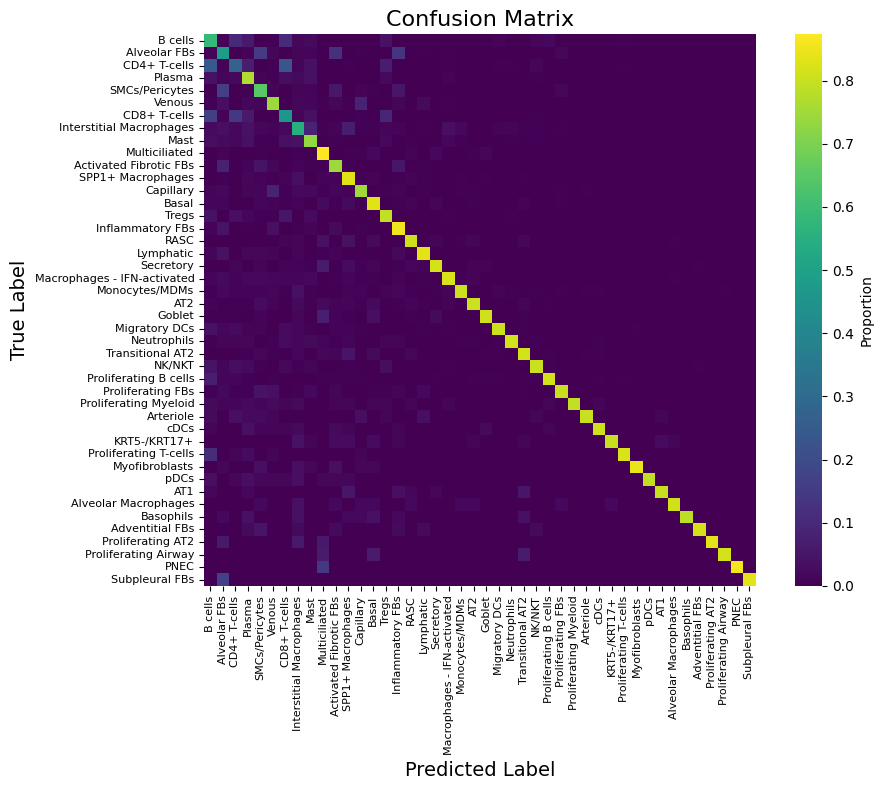


L1 lineage (L2→L1 agg)
Computing confusion matrix...
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/conf_matrix_level1.pdf


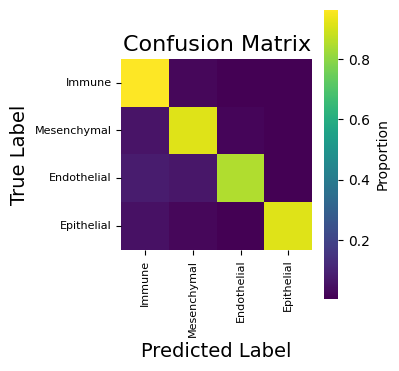


L1 lineage (L1 head)
Computing confusion matrix...
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/conf_matrix_level1_L1head.pdf


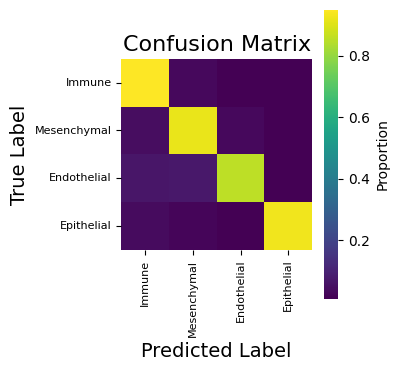


L12 sublineage
Computing confusion matrix...
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/conf_matrix_level12.pdf


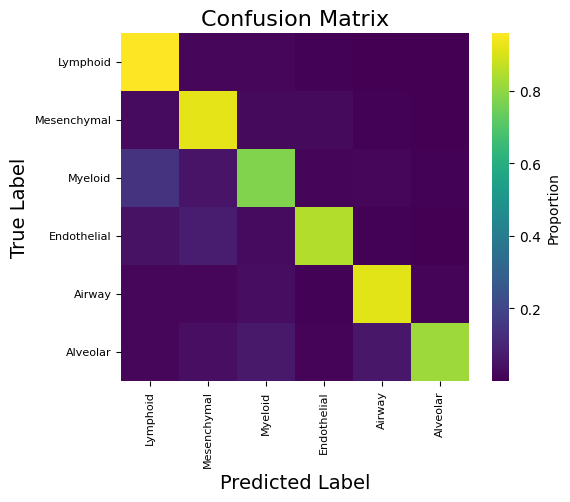


L3 CNiche
Computing confusion matrix...
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/conf_matrix_level3.pdf


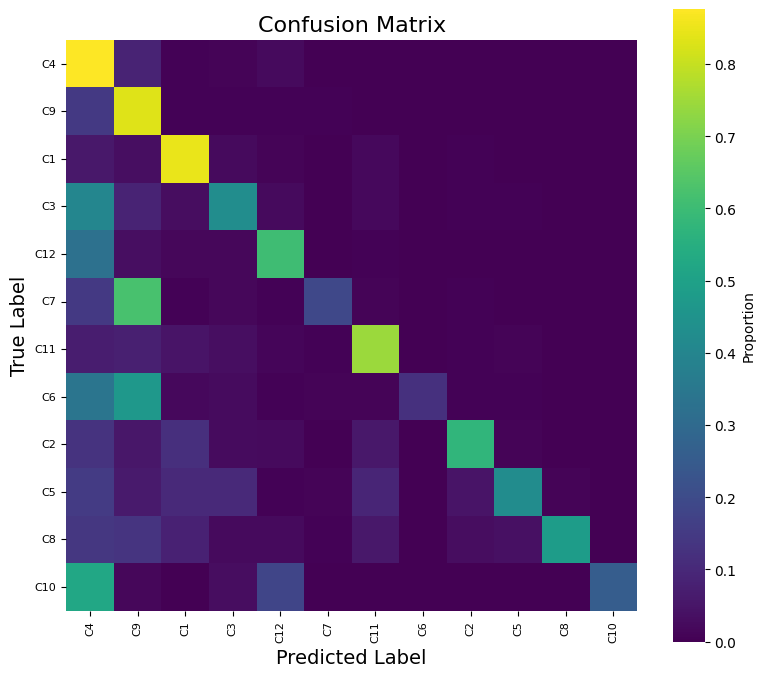


L4 TNiche
Computing confusion matrix...
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/conf_matrix_level4.pdf


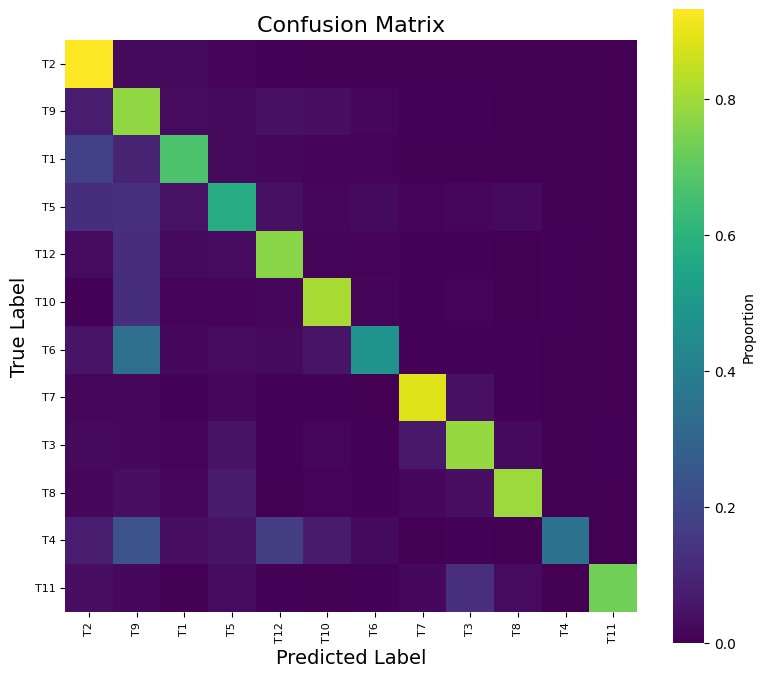

L1 agg vs L1 head agreement: 0.9785718952113412


In [13]:
# In-sample confusion matrices for every label tier (best-fold model in LP)
if isinstance(globals().get("LP"), dict) and LP.get("model") is not None:
    ensure_lp_extra_insample_preds(
        LP["model"], scaler, cv_data, device, predict_all_label_heads, globals()
    )
plot_he_confusion_matrices(plot_confusion_matrix, result_fig, cv_data, globals())


In [14]:
## Save validation metrics: CV fold means + in-sample per tier (L2/L1/L12/L3/L4)
import numpy as np

logo_summary = globals().get("logo_summary")
if logo_summary is None and isinstance(globals().get("LP"), dict):
    logo_summary = LP.get("logo_summary")
if logo_summary is None:
    raise NameError("Run the ablation / CV cell first (globals().update(LP)) to define logo_summary.")

metrics_csv_path = result_fig("validation_internal_metrics")

hce_w1_used = globals().get("hce_w1", 1.0)
hce_w2_used = globals().get("hce_w2", 1.0)
hce_w12_used = globals().get("hce_w12", 2.0)
hce_w_l12head_used = globals().get("hce_w_l12head", 1.0)
hce_w_l3_used = globals().get("hce_w_l3", 1.0)
hce_w_l4_used = globals().get("hce_w_l4", 1.0)
mean_best_epoch = int(round(float(np.mean([f["best_epoch"] for f in logo_summary["folds"]]))))

insample_tiers, _num_classes = build_insample_tier_metrics(globals(), cv_data if "cv_data" in globals() else None)

tier_extra = collect_hce_tier_metrics_extras(
    logo_summary=logo_summary,
    insample=insample_tiers,
    num_classes=_num_classes,
)

_l2_ins = insample_tiers.get("l2") or {}
_l1_ins = insample_tiers.get("l1") or {}

metrics_df, combined_df = save_hce_validation_metrics(
    val_acc=_l2_ins.get("accuracy", float("nan")),
    val_macro_f1=logo_summary["l2_macro_f1_mean"],
    val_weighted_f1=logo_summary["l2_weighted_f1_mean"],
    val_level1_acc=_l1_ins.get("accuracy", float("nan")),
    val_level1_macro_f1=logo_summary["l1_macro_f1_mean"],
    val_level1_weighted_f1=logo_summary["l1_weighted_f1_mean"],
    class_names=class_names if "class_names" in globals() else None,
    class_names_level1=class_names_level1 if "class_names_level1" in globals() else None,
    best_epoch=mean_best_epoch,
    hce_lambda=None,
    hce_w1=hce_w1_used,
    hce_w2=hce_w2_used,
    hce_w12=hce_w12_used,
    hce_w_l12head=hce_w_l12head_used,
    hce_w_l3=hce_w_l3_used,
    hce_w_l4=hce_w_l4_used,
    therapy_data=f"{therapy_data}_kfold_CV",
    metrics_csv_path=metrics_csv_path,
    extra_metrics=tier_extra,
)

print("\nPer-tier columns in CSV (cv_* = fold mean, insample_* = all cells, best-fold model):")
_tier_cols = [c for c in combined_df.columns if c.startswith(("cv_", "insample_", "num_"))]
print(combined_df[_tier_cols].tail(1).T)


Current run metrics:
             timestamp         therapy_data  best_epoch hce_lambda  hce_w1  \
0  2026-06-24 12:30:37  VUILD107MA_kfold_CV           0       None     1.0   

   hce_w2  hce_w12  hce_w_l12head  hce_w_l3  hce_w_l4  ...  \
0     2.0      1.0            1.0       1.0       1.0  ...   

   insample_l3_accuracy  insample_l3_macro_f1  insample_l3_weighted_f1  \
0              0.737832              0.590058                 0.714535   

   insample_l4_accuracy  insample_l4_macro_f1  insample_l4_weighted_f1  \
0              0.781995              0.737996                 0.776598   

   num_l1_head_classes  num_l12_classes  num_l3_classes  num_l4_classes  
0                    4                6              12              12  

[1 rows x 76 columns]

Saved comparison table to: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/validation_internal_metrics.csv

Visualizing per-class performance...
  ✓ Computed metrics for 44 classes
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/f1_perclass_level2.pdf


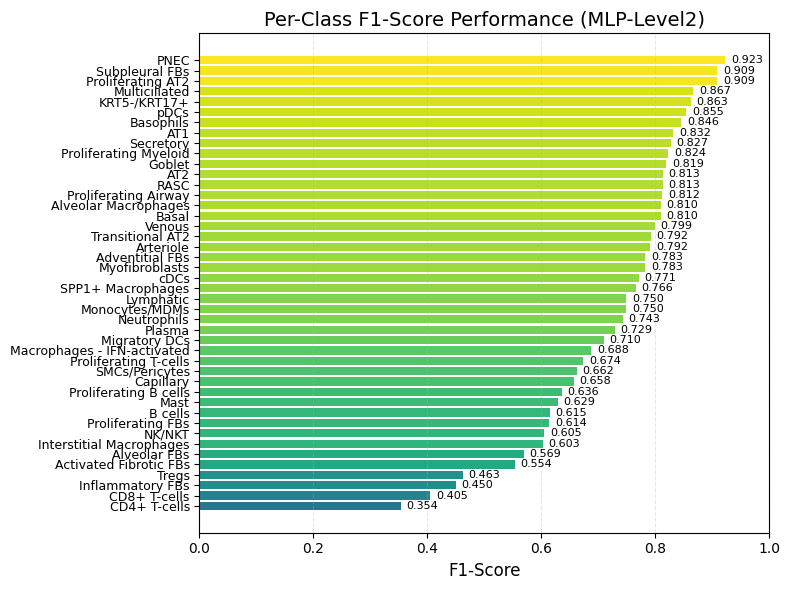


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 44
  Actual classes in test set: 44
  Feature dimension: 1024
  Model parameters: 1,729,358
  Best epoch: 0
  Test Accuracy: 0.6248
  Test Macro F1: 0.7245
  Test Weighted F1: 0.6222
Visualizing per-class performance...
  ✓ Computed metrics for 4 classes
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/f1_perclass_level1.pdf


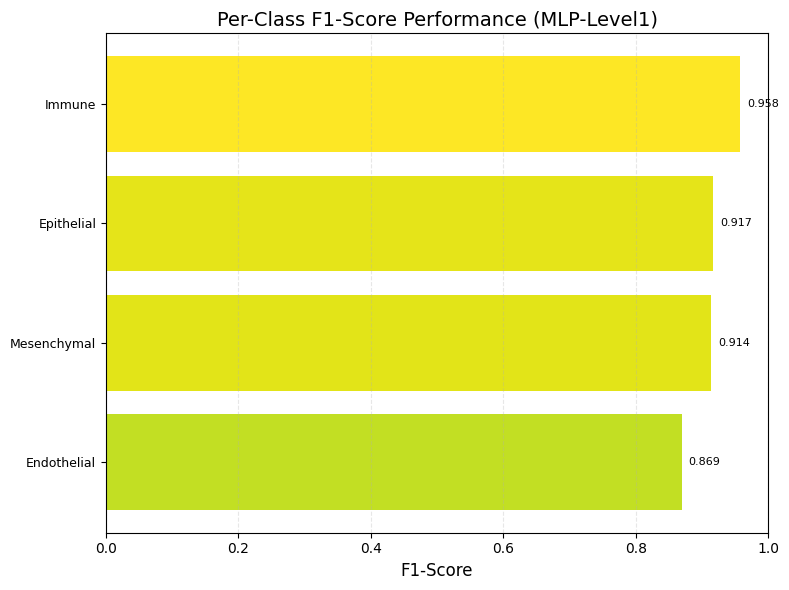


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 4
  Actual classes in test set: 4
  Feature dimension: 1024
  Model parameters: 1,729,358
  Best epoch: 0
  Test Accuracy: 0.9344
  Test Macro F1: 0.9144
  Test Weighted F1: 0.9341
Visualizing per-class performance...
  ✓ Computed metrics for 4 classes
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/f1_perclass_level1_L1head.pdf


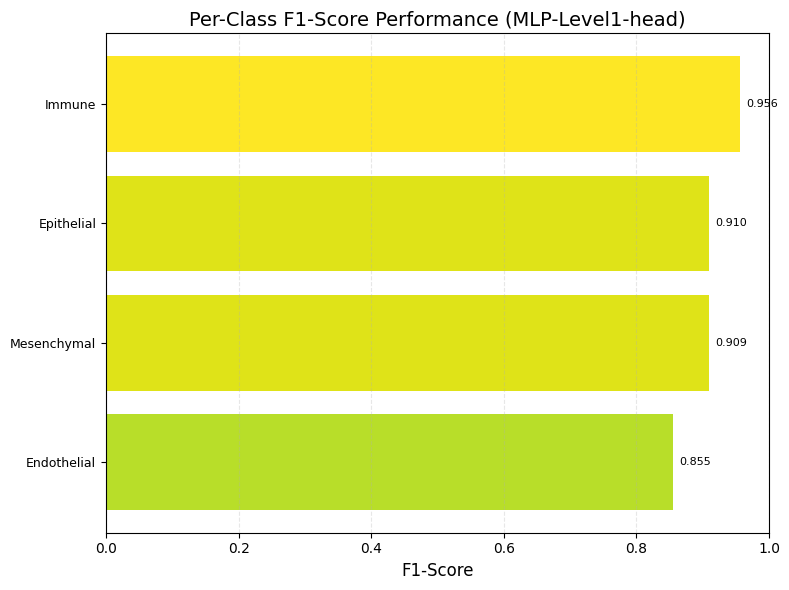


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 4
  Actual classes in test set: 4
  Feature dimension: 1024
  Model parameters: 1,729,358
  Best epoch: 0
  Test Accuracy: 0.9344
  Test Macro F1: 0.9144
  Test Weighted F1: 0.9341

L12 sublineage
Visualizing per-class performance...
  ✓ Computed metrics for 6 classes
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/f1_perclass_level12.pdf


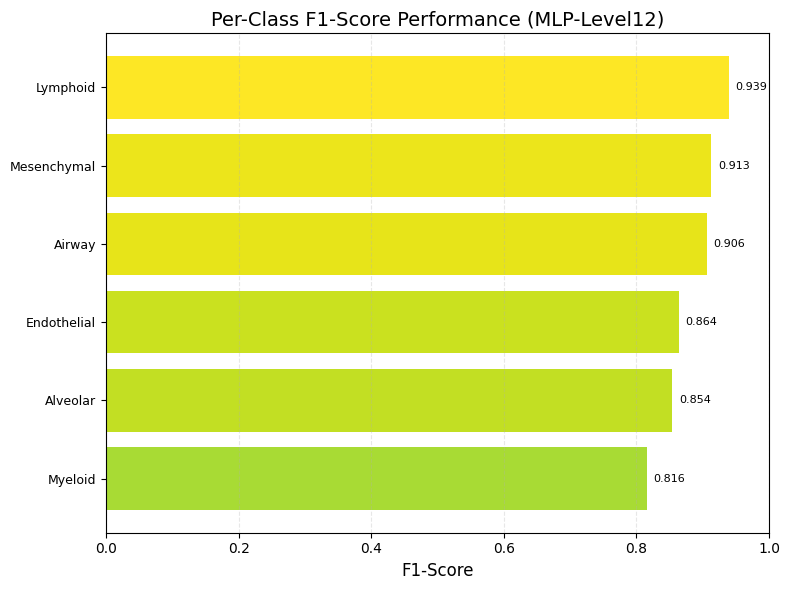


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 6
  Actual classes in test set: 6
  Feature dimension: 1024
  Model parameters: 1,729,358
  Best epoch: 0
  Test Accuracy: 0.9038
  Test Macro F1: 0.8820
  Test Weighted F1: 0.9027

L3 CNiche
Visualizing per-class performance...
  ✓ Computed metrics for 12 classes
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/f1_perclass_level3.pdf


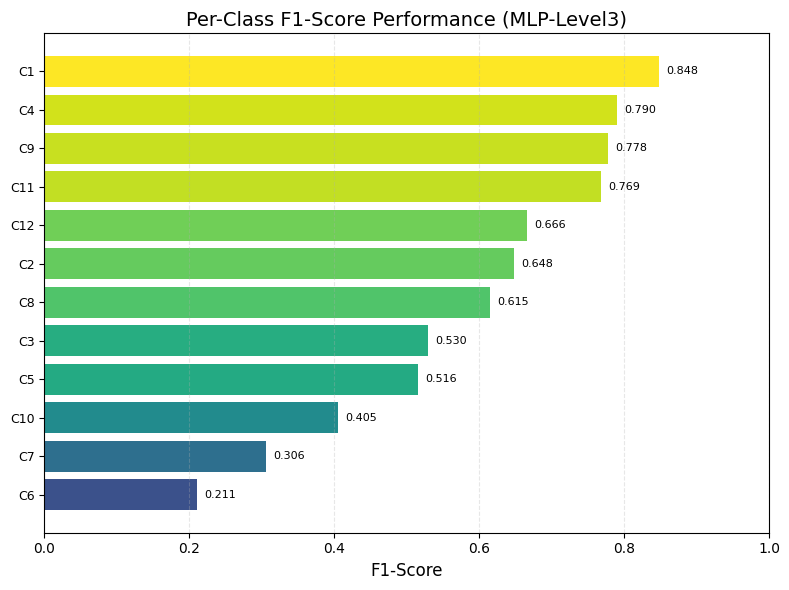


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 12
  Actual classes in test set: 12
  Feature dimension: 1024
  Model parameters: 1,729,358
  Best epoch: 0
  Test Accuracy: 0.7378
  Test Macro F1: 0.5901
  Test Weighted F1: 0.7145

L4 TNiche
Visualizing per-class performance...
  ✓ Computed metrics for 12 classes
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/f1_perclass_level4.pdf


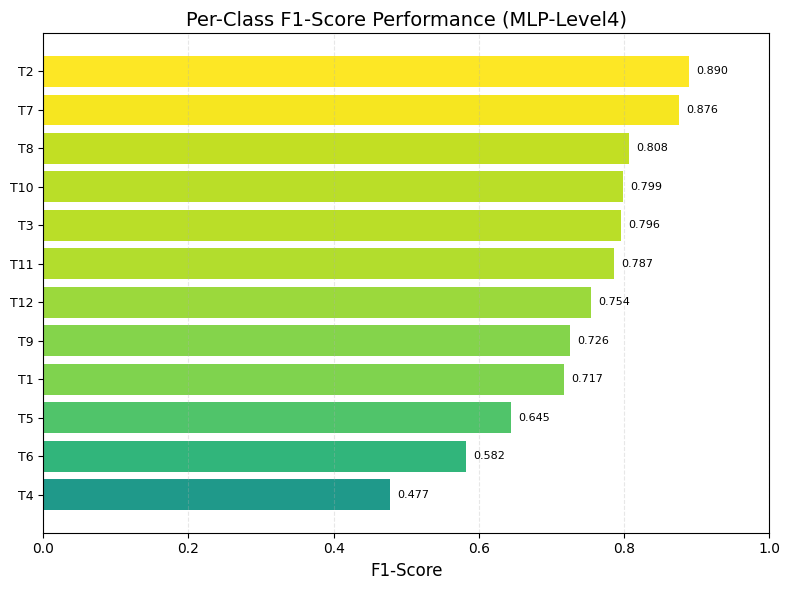


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 12
  Actual classes in test set: 12
  Feature dimension: 1024
  Model parameters: 1,729,358
  Best epoch: 0
  Test Accuracy: 0.7820
  Test Macro F1: 0.7380
  Test Weighted F1: 0.7766


In [15]:
# Per-class F1 for level2
metrics_df_level2 = plot_per_class_f1(
    val_labels,
    val_preds,
    class_names,
    model=model,
    device=device,
    train_dataset=train_dataset,
    val_dataset=val_dataset,
    input_dim=input_dim,
    best_epoch=best_epoch,
    test_acc=val_acc,
    test_macro_f1=val_macro_f1,
    test_weighted_f1=val_weighted_f1,
    model_name="MLP-Level2",
    y_sort_by="f1_asc",
    save_path=result_fig("f1_perclass_level2"),
)

metrics_df_level1 = plot_per_class_f1(
    val_labels_level1,
    val_preds_level1,
    class_names_level1,
    model=model,
    device=device,
    train_dataset=train_dataset,
    val_dataset=val_dataset,
    input_dim=input_dim,
    best_epoch=best_epoch,
    test_acc=val_level1_acc,
    test_macro_f1=val_level1_macro_f1,
    test_weighted_f1=val_level1_weighted_f1,
    model_name="MLP-Level1",
    y_sort_by="f1_asc",
    save_path=result_fig("f1_perclass_level1"),
)

if globals().get("val_preds_level1_head") is not None:
    plot_per_class_f1(
        val_labels_level1,
        val_preds_level1_head,
        class_names_level1,
        model=model,
        device=device,
        train_dataset=train_dataset,
        val_dataset=val_dataset,
        input_dim=input_dim,
        best_epoch=best_epoch,
        test_acc=val_level1_acc,
        test_macro_f1=val_level1_macro_f1,
        test_weighted_f1=val_level1_weighted_f1,
        model_name="MLP-Level1-head",
        y_sort_by="f1_asc",
        save_path=result_fig("f1_perclass_level1_L1head"),
    )

if isinstance(globals().get("LP"), dict) and LP.get("model") is not None:
    ensure_lp_extra_insample_preds(
        LP["model"], scaler, cv_data, device, predict_all_label_heads, globals()
    )
plot_he_f1_extra_tiers(
    plot_per_class_f1,
    result_fig,
    model,
    device,
    train_dataset,
    val_dataset,
    input_dim,
    best_epoch,
    globals(),
)


  Using provided X and y...
  ✓ Using provided y strings as original labels for spatial TRUE plot.
  X_all_scaled shape: (30614, 1024)
  y_all_encoded shape: (30614,)
  ✓ Final y_all_encoded dtype: int64
X_all_scaled:  (30614, 1024)
y_all_encoded:  (30614,)
  Total samples: 30614
  DataLoader batch_size: 1024, num_workers: 4

Final Performance on All Data:
  Accuracy: 0.6252
  Macro F1-score: 0.7247
  Weighted F1-score: 0.6227
all_preds:  (30614,)
unique_labels:  (44,)

Detailed Classification Report:
  Number of classes: 44
                             precision    recall  f1-score   support

                        AT1       0.87      0.80      0.83        59
                        AT2       0.82      0.80      0.81       228
     Activated Fibrotic FBs       0.44      0.75      0.55       745
            Adventitial FBs       0.75      0.82      0.78        44
               Alveolar FBs       0.70      0.48      0.57      3786
       Alveolar Macrophages       0.81      0.81      

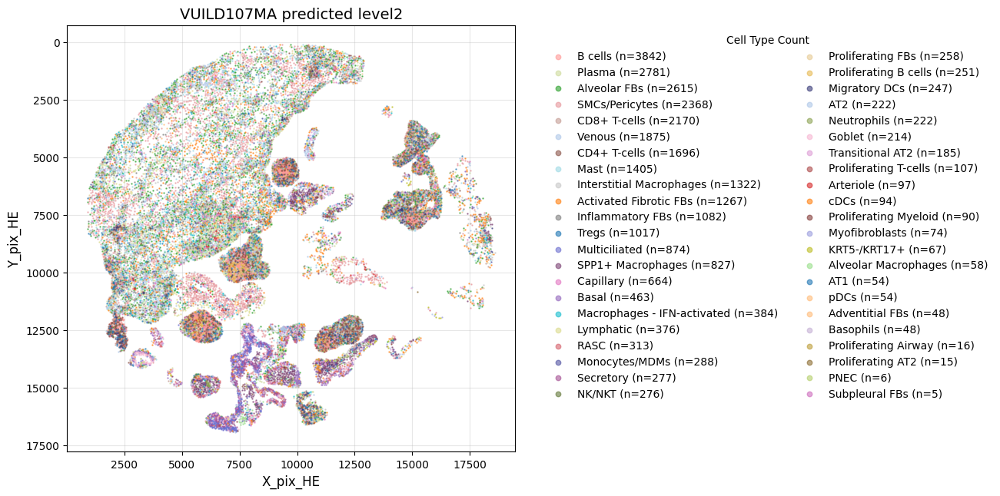


Plotting spatial distribution of TRUE level2 cell types...
Number of valid data points: 30614
Number of cell types: 44


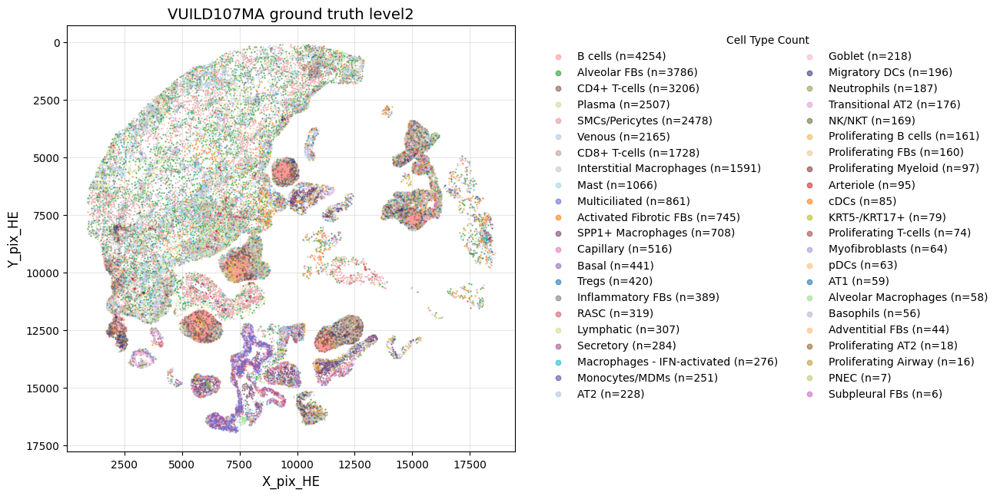

In [16]:
## Evaluate on all data: level2 spatial — predicted vs ground truth
# Rows must match cv_data filter and scaler fit on X_f.
all_acc, all_macro_f1, all_weighted_f1, all_preds, all_labels = evaluate_and_plot_on_all_data(
    model=model,
    matched_features_path="",
    class_names=class_names,
    evaluate=evaluate,
    plot_celltype_spatial_distribution=plot_celltype_spatial_distribution,
    CellTypeDataset=CellTypeDataset,
    device=device,
    scaler=scaler,
    val_loader=val_loader if "val_loader" in globals() else None,
    X=cv_data["X_f"],
    y=cv_data["y_f"],
    y_encoded=cv_data["y_encoded_f"],
    X_coords_matched=X_coords_plot if "X_coords_plot" in globals() else None,
    celltype_pred_dir=result_fig("celltype_valid_level2"),
    celltype_true_dir=result_fig("celltype_true_level2"),
    spatial_plot_mode="pred_true_l2",
    spatial_color_scheme="xenium_ct",
    spatial_title_pred_l2=f"{therapy_data} predicted level2",
    spatial_title_true_l2=f"{therapy_data} ground truth level2",
    celltype_pixel_NCRT_tumor1=celltype_pixel_NCRT_tumor1 if "celltype_pixel_NCRT_tumor1" in globals() else None,
)


  Level1 spatial plot: Xenium lineage colors (final_lineage palette).
Number of valid data points: 30614
Number of cell types: 4


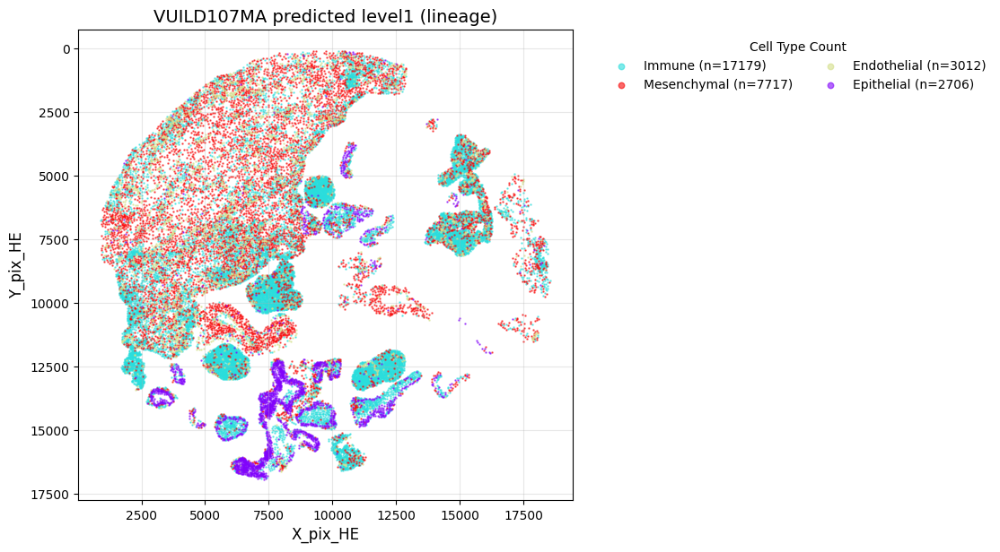

  Saved level1 predicted spatial plot: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/celltype_valid_level1.jpg
Number of valid data points: 30614
Number of cell types: 4


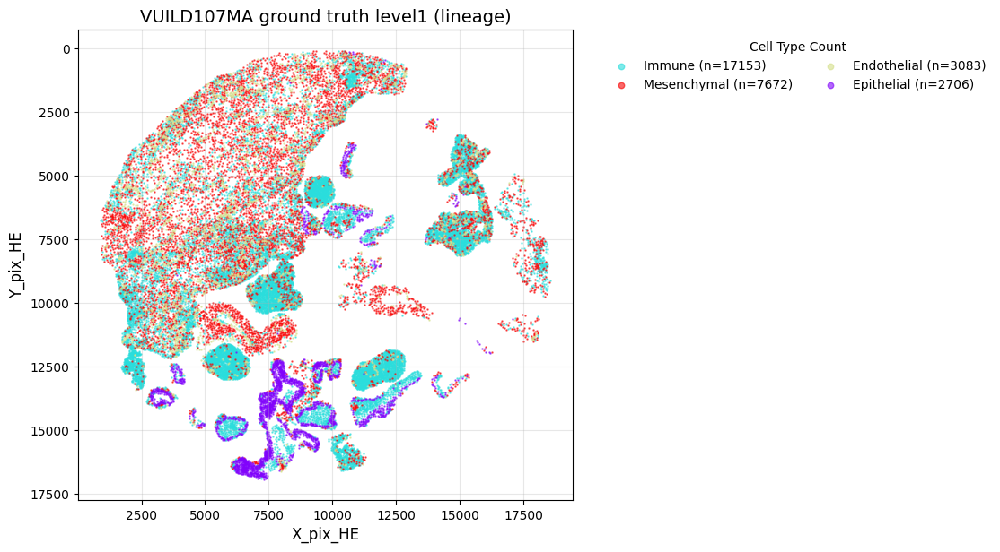

  Saved level1 true spatial plot: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/celltype_true_level1.jpg


In [17]:
plot_level1_spatial_distribution(
    matched_features_path=matched_features_path,
    all_preds=all_preds,
    class_names_level1=class_names_level1,
    class_names=class_names,
    y_encoded_f=y_encoded_f,
    y_level1_encoded_f=y_level1_encoded_f,
    plot_celltype_spatial_distribution=plot_celltype_spatial_distribution,
    save_path_pred=result_fig("celltype_valid_level1"),
    save_path_true=result_fig("celltype_true_level1"),
    spatial_color_scheme="xenium_lineage",
    title_pred=f"{therapy_data} predicted level1 (lineage)",
    title_true=f"{therapy_data} ground truth level1 (lineage)",
    fig_size=(10, 8),
    show=True,
    X_coords_matched=X_coords_plot if "X_coords_plot" in globals() else None,
    y_level1_f=cv_data["y_level1_f"],
)



L12 sublineage
Number of valid data points: 30614
Number of cell types: 6


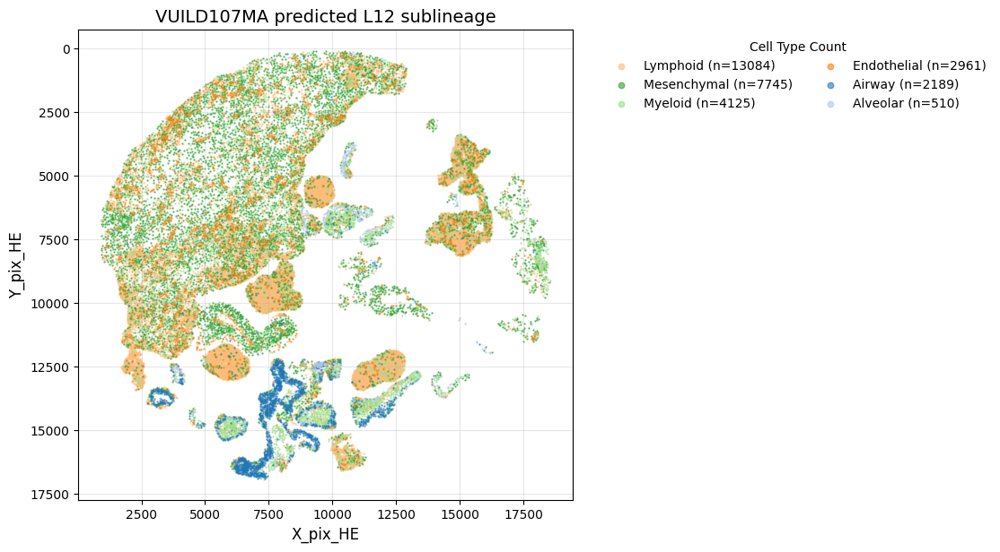

  Saved predicted spatial plot: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/celltype_valid_level12.jpg
Number of valid data points: 30614
Number of cell types: 6


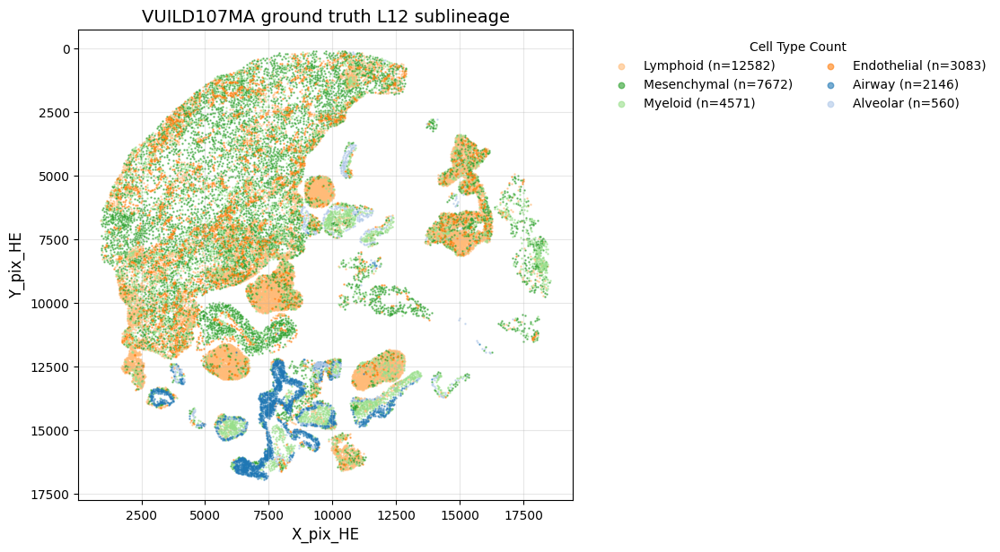

  Saved ground-truth spatial plot: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/celltype_true_level12.jpg

L3 CNiche
Number of valid data points: 30614
Number of cell types: 12


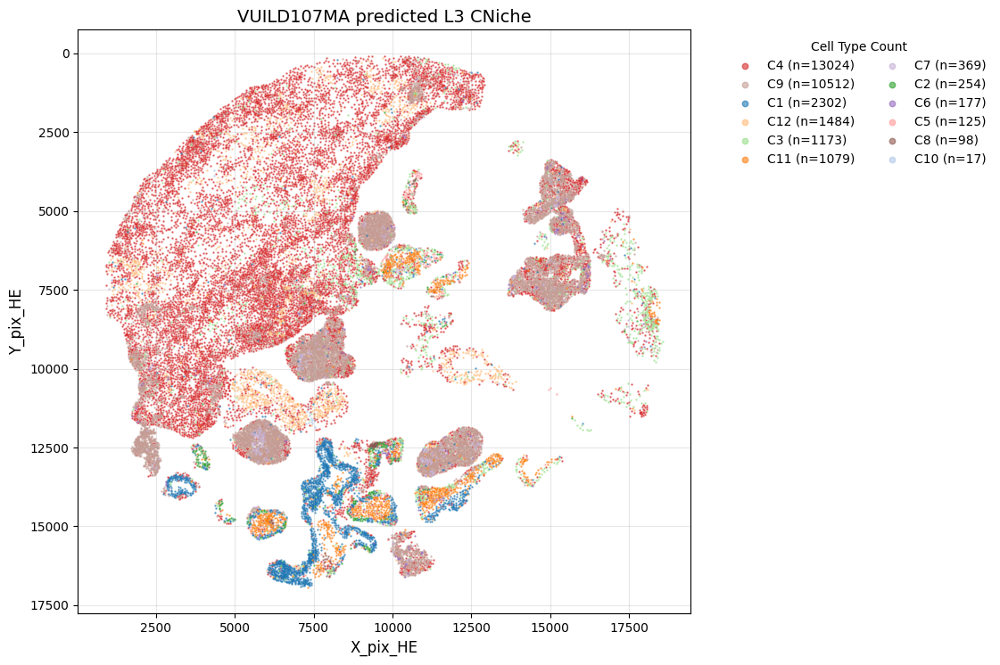

  Saved predicted spatial plot: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/celltype_valid_level3.jpg
Number of valid data points: 30614
Number of cell types: 12


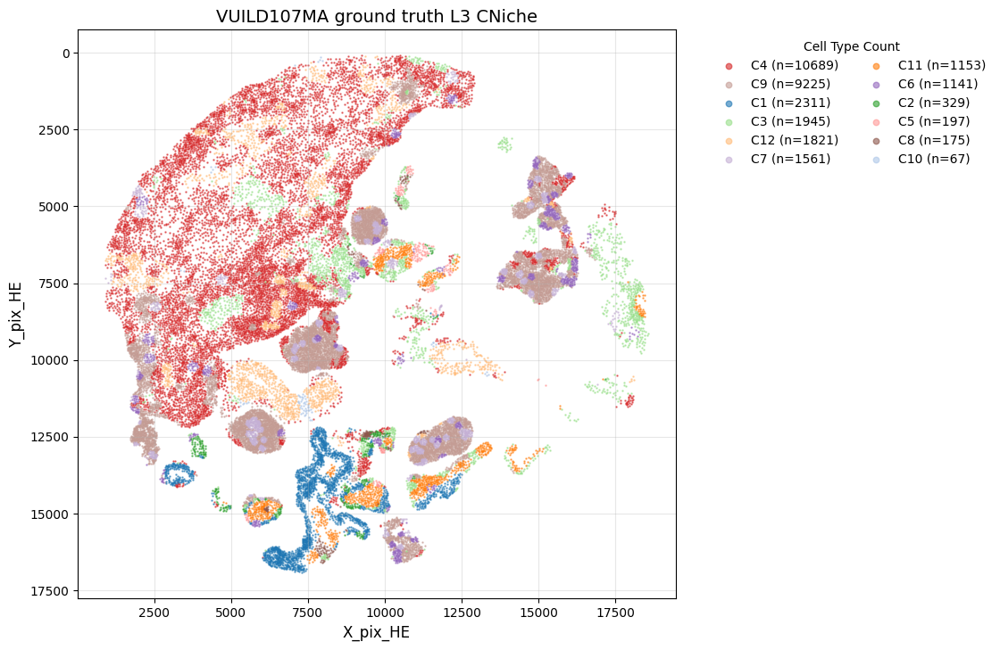

  Saved ground-truth spatial plot: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/celltype_true_level3.jpg

L4 TNiche
Number of valid data points: 30614
Number of cell types: 12


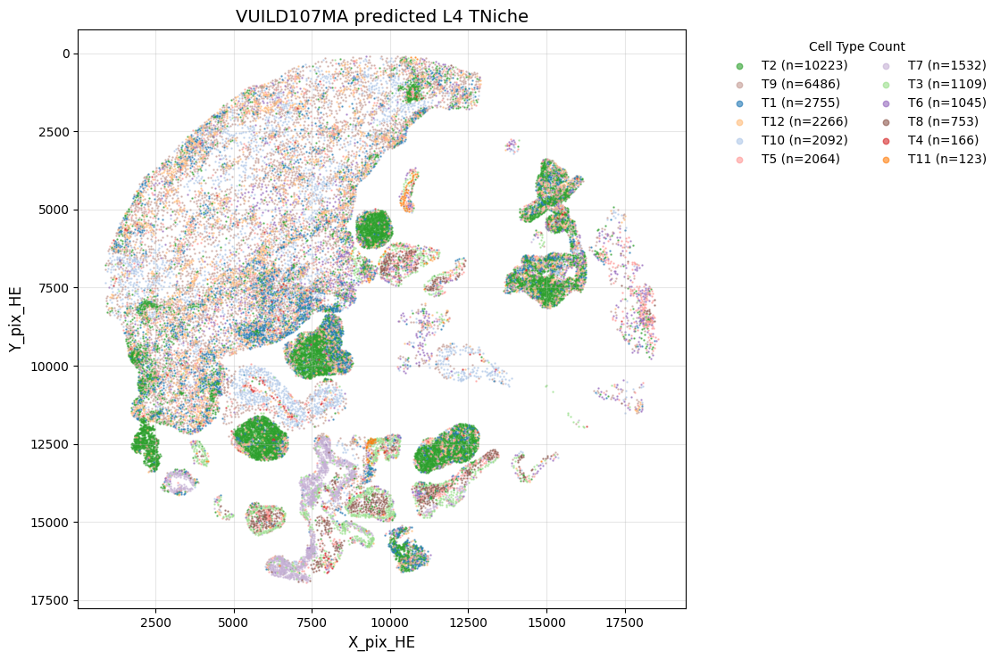

  Saved predicted spatial plot: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/celltype_valid_level4.jpg
Number of valid data points: 30614
Number of cell types: 12


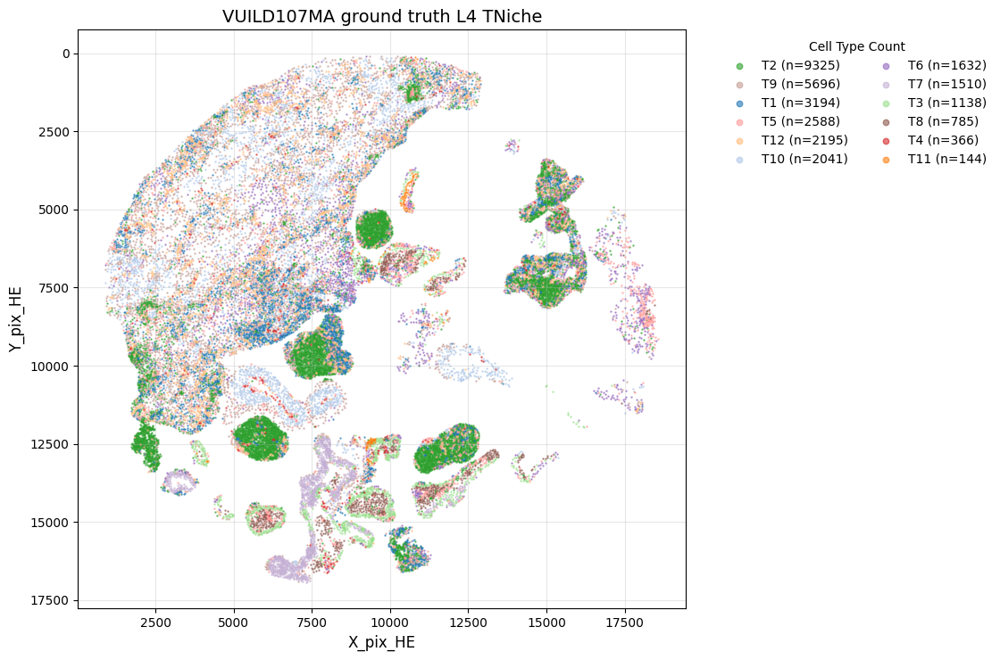

  Saved ground-truth spatial plot: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/celltype_true_level4.jpg


In [18]:
## L12 / L3 (CNiche) / L4 (TNiche) spatial — predicted vs ground truth
if isinstance(globals().get("LP"), dict) and LP.get("model") is not None:
    ensure_lp_extra_insample_preds(
        LP["model"], scaler, cv_data, device, predict_all_label_heads, globals()
    )
plot_he_spatial_extra_tiers(
    plot_tier_spatial_distribution,
    plot_celltype_spatial_distribution,
    result_fig,
    therapy_data,
    X_coords_plot if "X_coords_plot" in globals() else None,
    cv_data if "cv_data" in globals() else None,
    globals(),
)


## Predict StarDist

In [19]:
## Load best model for StarDist prediction.
_star_ckpt = globals().get("BEST_MLP_CHECKPOINT")
if _star_ckpt is None and isinstance(globals().get("LP"), dict):
    _bf = LP.get("best_fold")
    if isinstance(_bf, dict):
        _star_ckpt = _bf.get("checkpoint")
if _star_ckpt is None:
    _cand = get_select4_best_checkpoint_path(path, therapy_data, therapy_model)
    if os.path.isfile(_cand):
        _star_ckpt = _cand

model_star = load_model_for_predict(
    path,
    therapy_data,
    therapy_model,
    parent_dir=True,
    checkpoint_path=_star_ckpt,
    device=device if "device" in globals() else None,
)

Loading best model for StarDist prediction...
  Checkpoint file: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases_Select4/VUILD107MA/VUILD107MA_project_all_UNI/best_mlp_gpu.pt
  Inferred hidden_dims from checkpoint: [1024, 512, 256]
✓ StarDist model loaded


In [20]:
hist_embedding_stardist_dir = Path(
    f'{path}Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/'
    f'Data/Complete_Cases/{therapy_data}/{therapy_model}/ImgEmbeddings_all_stardist/sc_pth_16_16'
)
select4_sample_dir = f'{path}Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/{therapy_data}'
stardist_raw_path = f'{select4_sample_dir}/{therapy_data}_Float_prob0.01_nms_0.3.csv'
xenium_cell_path = f'{select4_sample_dir}/{therapy_data}_cells_partitioned_by_annotation_sample_match_with_pixel.csv'
celltype_pixel_stardist_path = f'{select4_sample_dir}/{therapy_data}_cells_matched_by_stardist.csv'
matched_features_stardist_path = f"{select4_sample_dir}/{therapy_data}_matched_features_stardist.h5ad"

## 2026.06.24 LLY Matched features as AnnData (.h5ad) for Xenium lung (GT vs StarDist)
level1_name = globals().get("level1_name", "celltype_level1")
_column_rename = globals().get("column_rename", base.XENIUM_CELL_COORD_COLUMN_RENAME_FULL)
match_tolerance = 1.0

## In-memory rename (final_CT→celltype, …) for matching; restore original names before saving CSV for h5ad.
celltype_xenium = load_cell_pixcoords(xenium_cell_path, column_rename=_column_rename, auto_rename=False)
star_raw = pd.read_csv(stardist_raw_path)
celltype_pixel_NCRT_stardist = match_celltype2stardist(
    celltype_xenium,
    star_raw,
    celltype_pixel_coords_cols=("X_pix_HE", "Y_pix_HE"),
    stardist_pixel_coords_cols=("centroid_x", "centroid_y"),
)
celltype_pixel_NCRT_stardist = celltype_pixel_NCRT_stardist.dropna(subset=["centroid_x", "centroid_y"])
_restore_h5ad_cols = {tgt: src for src, tgt in _column_rename.items() if tgt in celltype_pixel_NCRT_stardist.columns}
celltype_pixel_NCRT_stardist.rename(columns=_restore_h5ad_cols).to_csv(celltype_pixel_stardist_path, index=False)
print(f"Saved StarDist matched cells: {celltype_pixel_stardist_path}  shape={celltype_pixel_NCRT_stardist.shape}")

adata_star = match_hist2cell_h5ad(
    cell_coords_path=celltype_pixel_stardist_path,
    hist_embedding_dir=hist_embedding_stardist_dir,
    matched_h5ad_path=matched_features_stardist_path,
    coord_cols=("centroid_x", "centroid_y"),
    tolerance=match_tolerance,
    pth_prefix=therapy_data,
    level1_name=level1_name,
    column_rename=_column_rename,
    auto_rename=False,
    spatial_cols=("centroid_x", "centroid_y"),
    spatial_he_cols=("X_pix_HE", "Y_pix_HE"),
)
print(adata_star)
print('obs columns:', list(adata_star.obs.columns))
print('obsm keys:', list(adata_star.obsm.keys()))

# Backward-compatible names for downstream StarDist cells
X_star = adata_X_to_dense(adata_star.X)
y_star = adata_star.obs["final_CT"].to_numpy()
y_star_level1 = adata_star.obs["final_lineage"].to_numpy()
y_star_level12 = adata_star.obs["final_sublineage"].to_numpy()
y_star_level3 = adata_star.obs["CNiche"].to_numpy()
y_star_level4 = adata_star.obs["TNiche"].to_numpy()
X_coords_star = adata_star.obsm["spatial"]

Loading celltype Ground Truth ...


  Column rename applied: {'final_CT': 'celltype', 'final_sublineage': 'celltype_level12', 'final_lineage': 'celltype_level1', 'CNiche': 'celltype_level3', 'TNiche': 'celltype_level4'}
  Loaded 30615 cells
  Cell types: 45 unique types

celltype_pixel_coords shape: (30615, 2)
stardist_pixel_coords shape: (105857, 2)
Building KDTree for star_coords...
Finding 100 nearest neighbors for each celltype point...
Nearest neighbor search completed. Distance matrix shape: (30615, 100)

Using greedy nearest neighbor matching...
Matched 30615 points
Matched distance: Mean, Median, Max: 13.00, 10.33, 166.97

Matched points summary:
  Total points in celltype_pixel_coords: 30615
  Matched points: 30615
  Unmatched points: 0
Matched of PCF-HE-StarDist: (30615, 21)
Saved StarDist matched cells: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_cells_matched_by_stardist.csv  shape=(30615, 21)
Loading celltyp

Loading .pth files (workers=16): 100%|██████████| 105850/105850 [01:47<00:00, 984.45it/s] 


  Successfully loaded 105850 embeddings
  Embedding dimension: (1024,)

Matching embeddings with celltype data (this may take a few minutes)...
  Using specified coordinates: centroid_x, centroid_y
  Building KDTree for embeddings: 105,850 points
  KDTree matched 30,615 / 30,615 cells (100.00%).
  Matched 30615 cells out of 30615
  Match rate: 100.00%
  ✓ Saved matched h5ad to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_matched_features_stardist.h5ad (30,615 cells × 1024 features)
AnnData object with n_obs × n_vars = 30615 × 1024
    obs: 'CNiche', 'TNiche', 'final_CT', 'final_lineage', 'final_sublineage', 'tma'
    uns: 'cell_coords_path', 'matched_n_cells', 'embedding_dim'
    obsm: 'spatial', 'spatial_HE'
obs columns: ['CNiche', 'TNiche', 'final_CT', 'final_lineage', 'final_sublineage', 'tma']
obsm keys: ['spatial', 'spatial_HE']


  Loading data from matched_features_path...
  ✓ Loaded X from /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_matched_features_stardist.h5ad: (30615, 1024)
  ✓ Loaded y from /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_matched_features_stardist.h5ad: (30615,), dtype: object
  ⚠ prediction_only=True: Labels will be used for visualization only, not for evaluation.
  ✓ Keeping labels as strings for visualization (no encoding needed)
  ✓ Scaled X using provided scaler
  X_all_scaled shape: (30615, 1024)
  No labels available - prediction mode only
X_all_scaled:  (30615, 1024)
dummy_labels:  (30615,)
  Total samples: 30615
  DataLoader batch_size: 1024, num_workers: 4
  Predicting on new data (no labels for evaluation)...


Predicting: 100%|██████████| 30/30 [00:00<00:00, 56.86it/s]



Prediction completed:
  Total predictions: 30615
  Predicted classes: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 39 40 41 42 43]
  ✓ Using original labels for visualization: 30615 labels
  ⚠ 1 true labels are not in class_names; excluding them from metric computation.
  ✓ Computed metrics in prediction_only mode from aligned true labels: acc=0.3331, macro_f1=0.2241, weighted_f1=0.3353

Preparing spatial distribution plot...
  Matching predictions with coordinates...
  ✓ Loaded coordinates from /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_matched_features_stardist.h5ad: (30615, 2)
  Coordinates shape: (30615, 2)
  Predictions shape: (30615,)
  ✓ Created prediction DataFrame with 30615 cells

Plotting spatial distribution of PREDICTED level2 cell types...
Number of valid data points: 30615
Number of cell types: 43


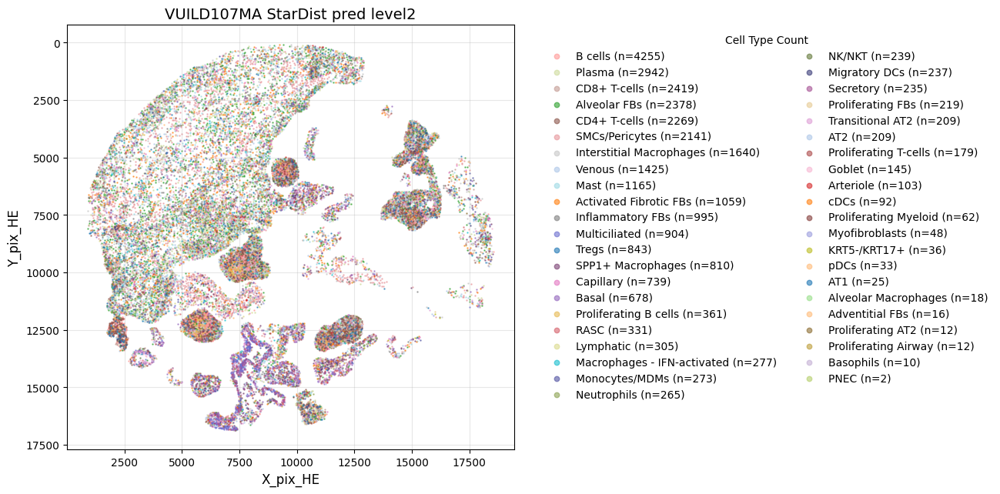


Plotting spatial distribution of TRUE level2 cell types...
Number of valid data points: 30615
Number of cell types: 45


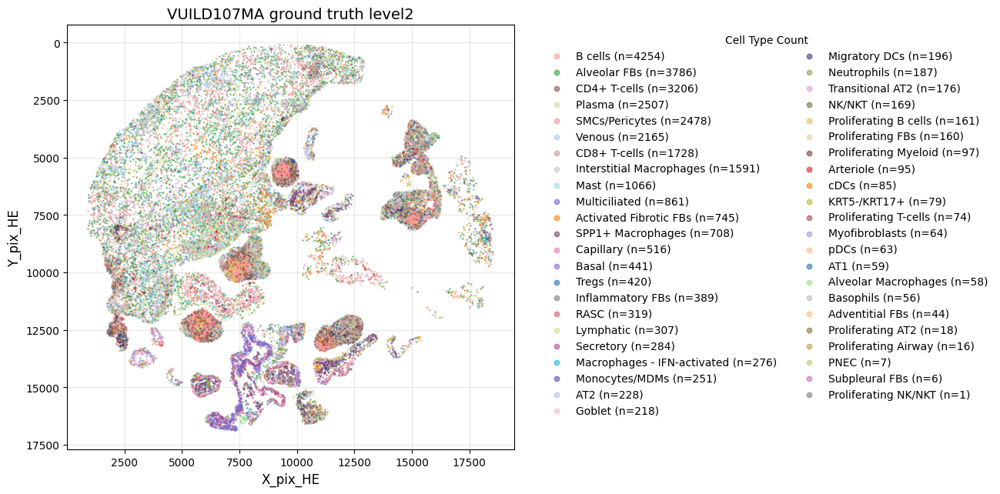

In [21]:
class_names_star = globals().get("class_names_star")
if class_names_star is None:
    class_names_star = class_names

all_acc, all_macro_f1, all_weighted_f1, all_preds, all_labels = evaluate_and_plot_on_all_data(
    model=model_star,
    matched_features_path=matched_features_stardist_path,
    class_names=class_names_star,
    evaluate=evaluate,
    plot_celltype_spatial_distribution=plot_celltype_spatial_distribution,
    CellTypeDataset=CellTypeDataset,
    device=device,
    scaler=scaler,
    val_loader=None,
    prediction_only=True,
    X_coords_matched=X_coords_star if "X_coords_star" in globals() else None,
    y_level1_f=y_star_level1 if "y_star_level1" in globals() else None,
    celltype_pred_dir=result_fig("stardist_pred_level2"),
    # celltype_true_dir=result_fig("stardist_true_level2"),
    spatial_plot_mode="pred_true_l2",
    spatial_color_scheme="xenium_ct",
    spatial_title_pred_l2=f"{therapy_data} StarDist pred level2",
    spatial_title_true_l2=f"{therapy_data} ground truth level2",
    celltype_pixel_NCRT_tumor1=celltype_pixel_NCRT_tumor1 if "celltype_pixel_NCRT_tumor1" in globals() else None,
)


  Level1 spatial plot: Xenium lineage colors (final_lineage palette).
Number of valid data points: 30615
Number of cell types: 4


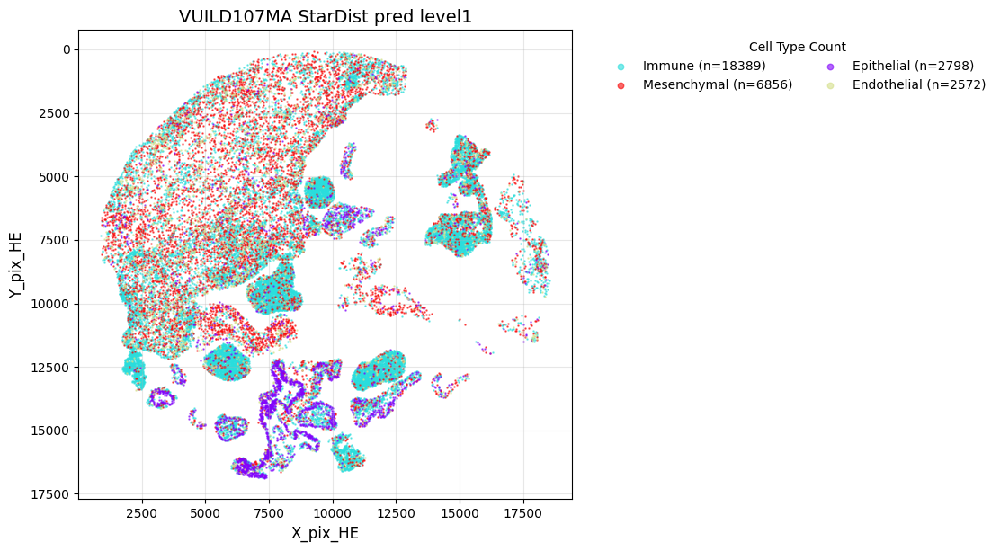

  Saved level1 predicted spatial plot: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/celltype_pred_stardist_level1.jpg
Number of valid data points: 30615
Number of cell types: 4


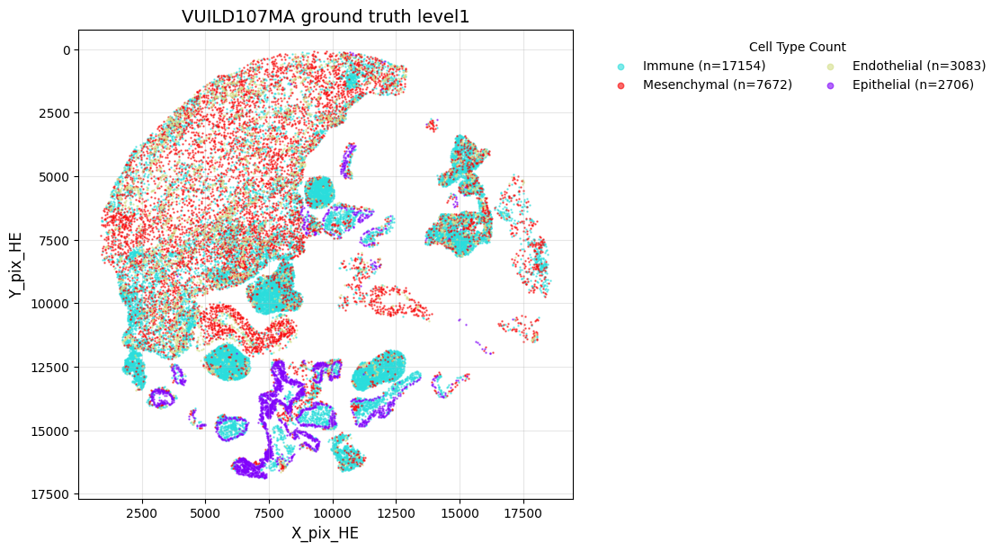

Saved: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/celltype_pred_stardist_level1.jpg


In [22]:
# L2→L1 mapping comes from HE cv_data (same class_names / le_* as the trained model).
# Do not le_level2.transform(y_star): StarDist matched cells can include CT labels absent from training.
plot_level1_spatial_distribution(
    matched_features_path=matched_features_stardist_path,
    all_preds=all_preds,
    class_names_level1=class_names_level1,
    class_names=class_names,
    y_encoded_f=y_encoded_f,
    y_level1_encoded_f=y_level1_encoded_f,
    plot_celltype_spatial_distribution=plot_celltype_spatial_distribution,
    save_path_pred=result_fig("stardist_pred_level1"),
    # save_path_true=result_fig("stardist_true_level1"),
    spatial_color_scheme="xenium_lineage",
    fig_size=(10, 8),
    show=True,
    X_coords_matched=X_coords_star,
    y_level1_f=y_star_level1,
    spatial_title_pred_l1=f"{therapy_data} StarDist pred level1",
    spatial_title_true_l1=f"{therapy_data} ground truth level1",
)
print(f"Saved: {result_fig('stardist_pred_level1')}")



L12 sublineage (StarDist)
Number of valid data points: 30615
Number of cell types: 6


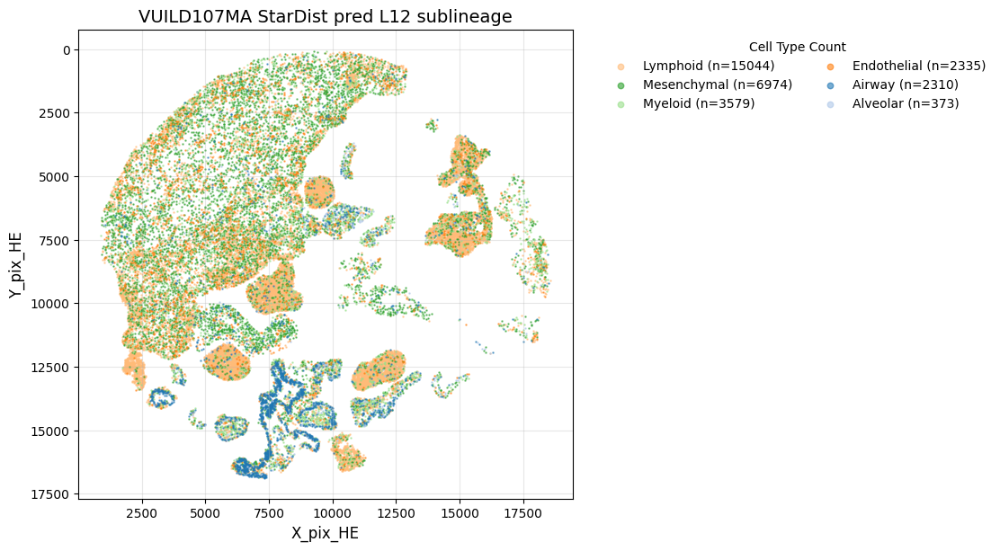

  Saved predicted spatial plot: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/celltype_pred_stardist_level12.jpg
Number of valid data points: 30615
Number of cell types: 6


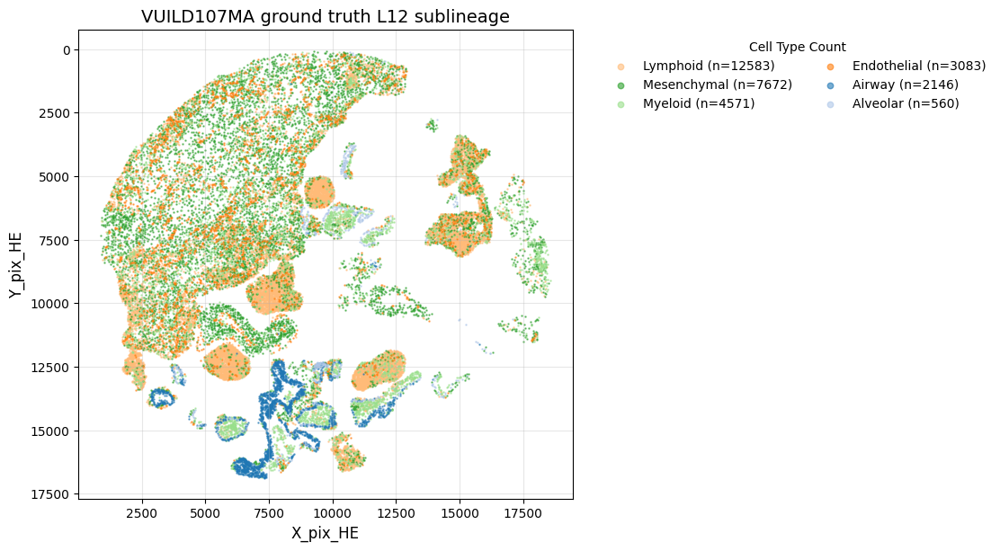

  Saved ground-truth spatial plot: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/celltype_true_stardist_level12.jpg
Saved: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/celltype_pred_stardist_level12.jpg

L3 CNiche (StarDist)
Number of valid data points: 30615
Number of cell types: 12


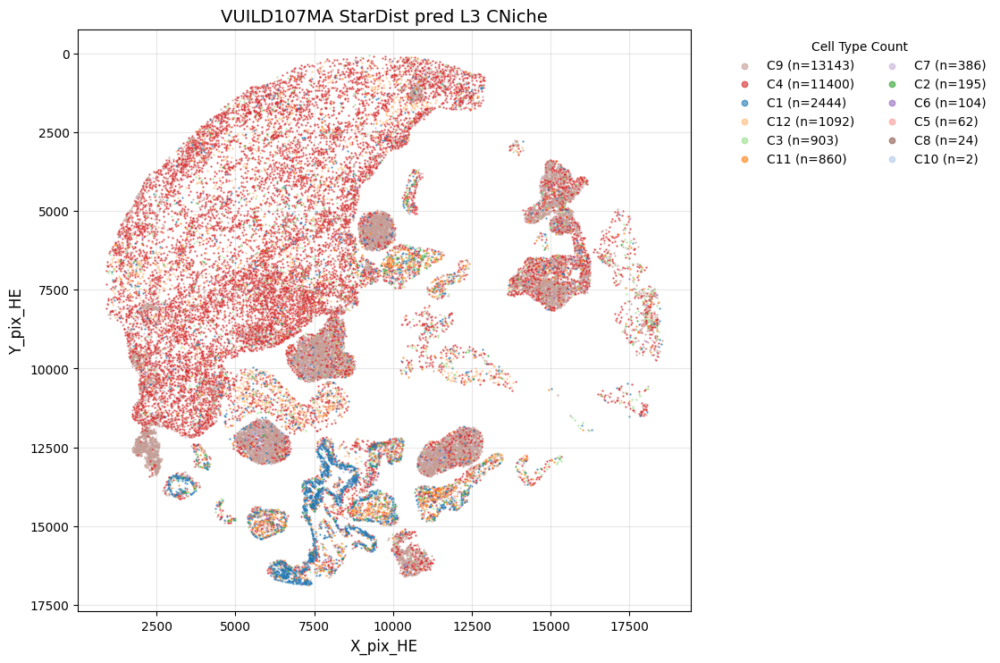

  Saved predicted spatial plot: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/celltype_pred_stardist_level3.jpg
Number of valid data points: 30615
Number of cell types: 12


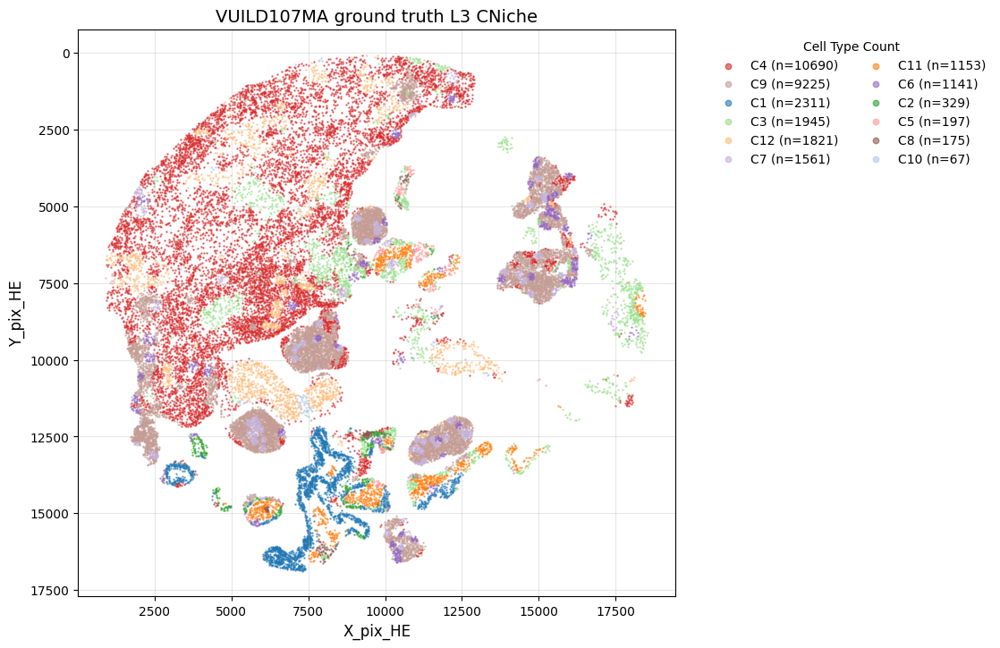

  Saved ground-truth spatial plot: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/celltype_true_stardist_level3.jpg
Saved: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/celltype_pred_stardist_level3.jpg

L4 TNiche (StarDist)
Number of valid data points: 30615
Number of cell types: 12


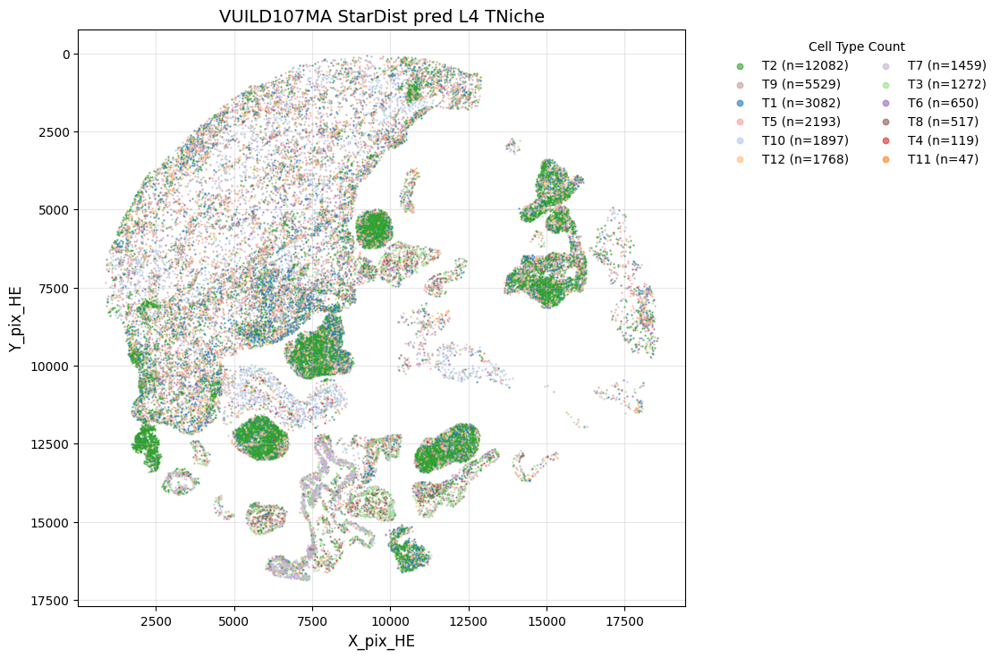

  Saved predicted spatial plot: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/celltype_pred_stardist_level4.jpg
Number of valid data points: 30615
Number of cell types: 12


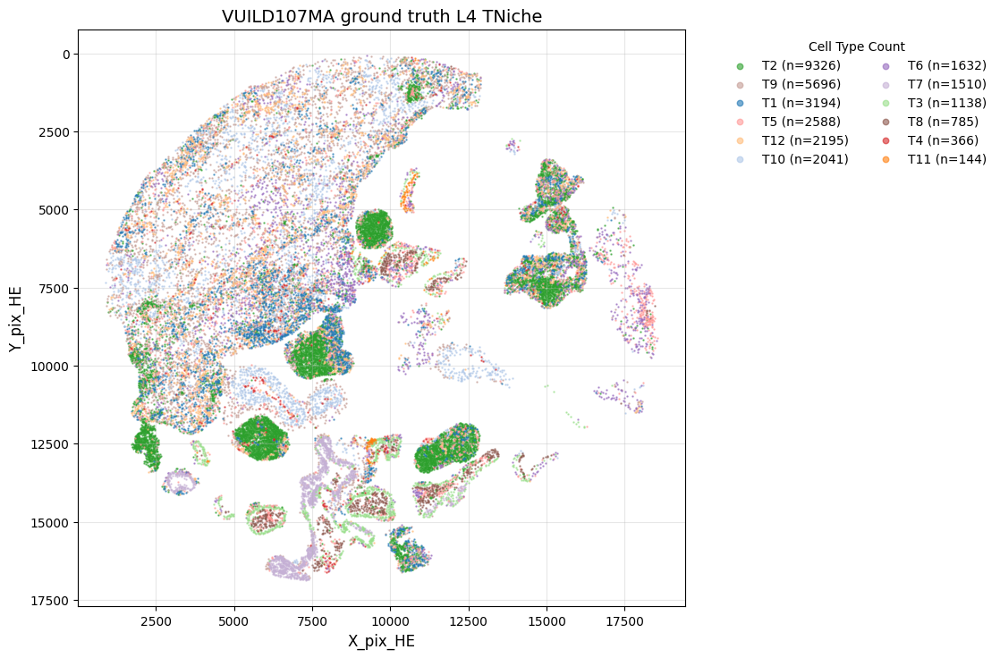

  Saved ground-truth spatial plot: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/celltype_true_stardist_level4.jpg
Saved: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/celltype_pred_stardist_level4.jpg


In [23]:
## StarDist: L12 / L3 (CNiche) / L4 (TNiche) spatial — predicted vs ground truth
if not hasattr(model_star, "level12_head"):
    print("Skip StarDist L12/L3/L4 spatial: model_star is not five-head.")
else:
    _star_heads = stardist_head_preds(model_star, scaler, X_star, device, predict_all_label_heads)
    plot_stardist_spatial_extra(
        plot_tier_spatial_distribution,
        plot_celltype_spatial_distribution,
        result_fig,
        therapy_data,
        X_coords_star,
        _star_heads,
        cv_data if "cv_data" in globals() else None,
        globals(),
    )


Visualizing per-class accuracy...
  ⚠ Excluding 1 samples with out-of-range labels/preds (valid class indices: 0–43).
  ✓ Computed metrics for 44 classes


Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/acc_level2_stardist.pdf


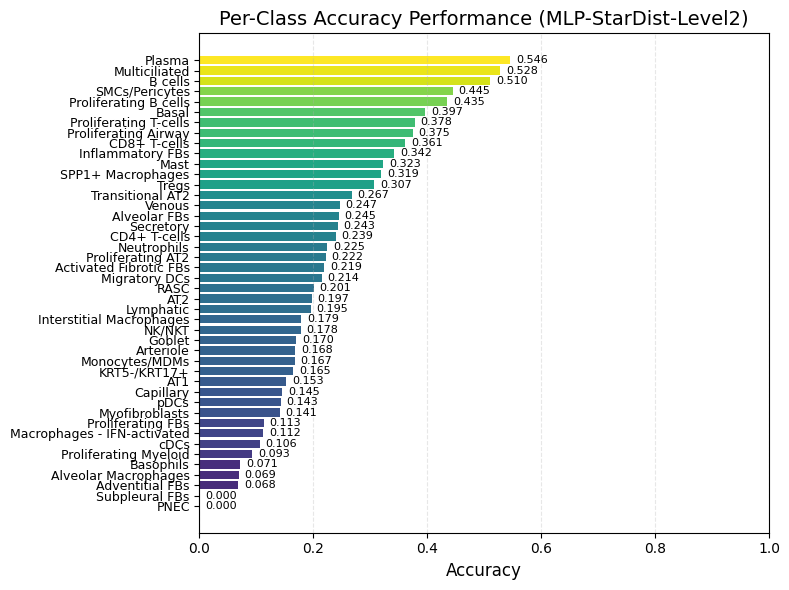


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 44
  Actual classes in test set: 44
  Model parameters: 1,729,358
  Test Accuracy: 0.3331
  Test Macro F1: 0.2241
  Test Weighted F1: 0.3353
Saved: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/acc_level2_stardist.pdf
  Level1 metrics from level2 preds: acc=0.7257, macro_f1=0.6234, weighted_f1=0.7195
Visualizing per-class accuracy...
  ✓ Computed metrics for 4 classes
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/acc_level1_stardist.pdf


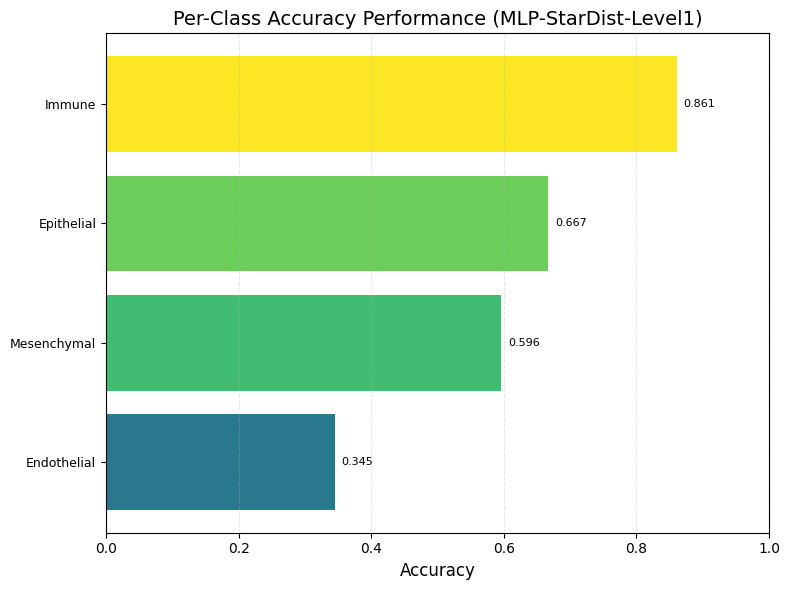


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 4
  Actual classes in test set: 4
  Model parameters: 1,729,358
  Test Accuracy: 0.7257
  Test Macro F1: 0.6234
  Test Weighted F1: 0.7195
Saved: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/acc_level1_stardist.pdf
  Level1 metrics from L1 head: acc=0.7222, macro_f1=0.6241, weighted_f1=0.7198
Visualizing per-class accuracy...
  ✓ Computed metrics for 4 classes
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/acc_level1_stardist_L1head.pdf


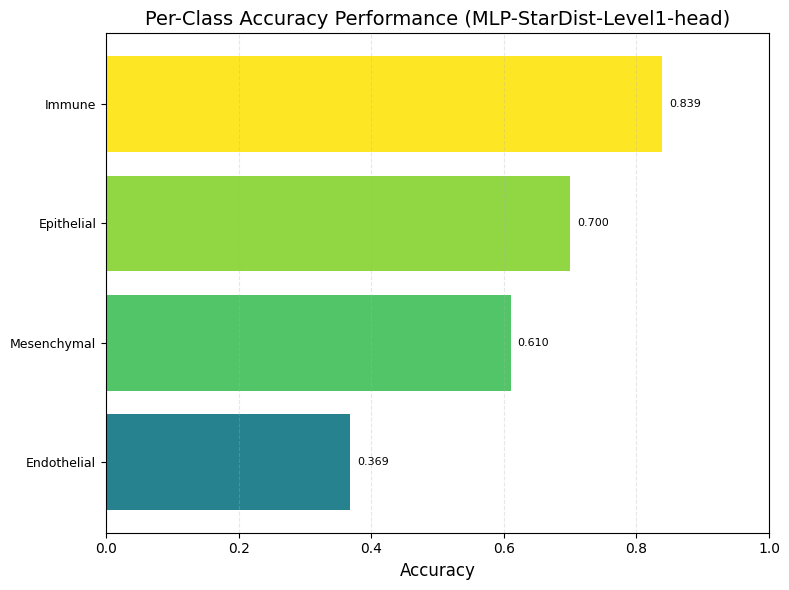


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 4
  Actual classes in test set: 4
  Model parameters: 1,729,358
  Test Accuracy: 0.7222
  Test Macro F1: 0.6241
  Test Weighted F1: 0.7198
Saved: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/acc_level1_stardist_L1head.pdf

L12 sublineage (StarDist): acc=0.6413, macro_f1=0.5100
Visualizing per-class accuracy...
  ✓ Computed metrics for 6 classes
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/acc_level12_stardist.pdf


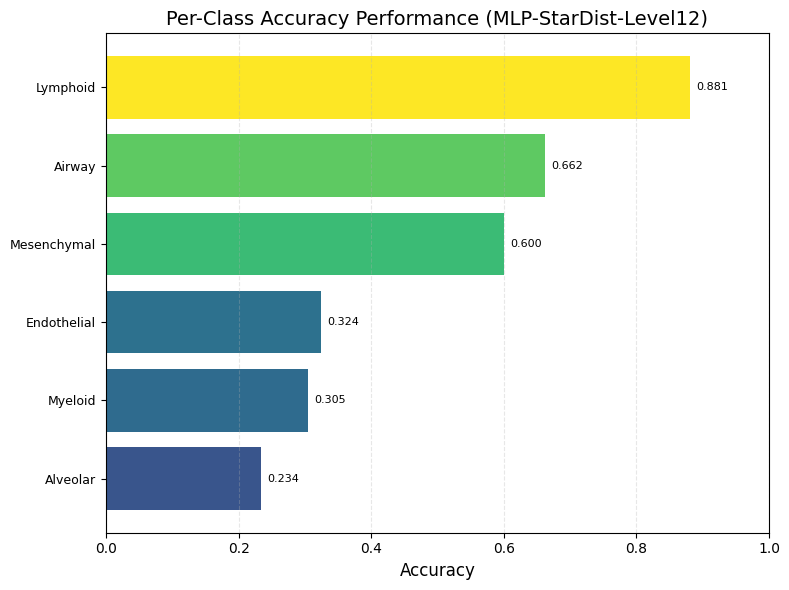


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 6
  Actual classes in test set: 6
  Model parameters: 1,729,358
  Test Accuracy: 0.6413
  Test Macro F1: 0.5100
  Test Weighted F1: 0.6254
Saved: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/acc_level12_stardist.pdf

L3 CNiche (StarDist): acc=0.5470, macro_f1=0.2555
Visualizing per-class accuracy...
  ✓ Computed metrics for 12 classes
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/acc_level3_stardist.pdf


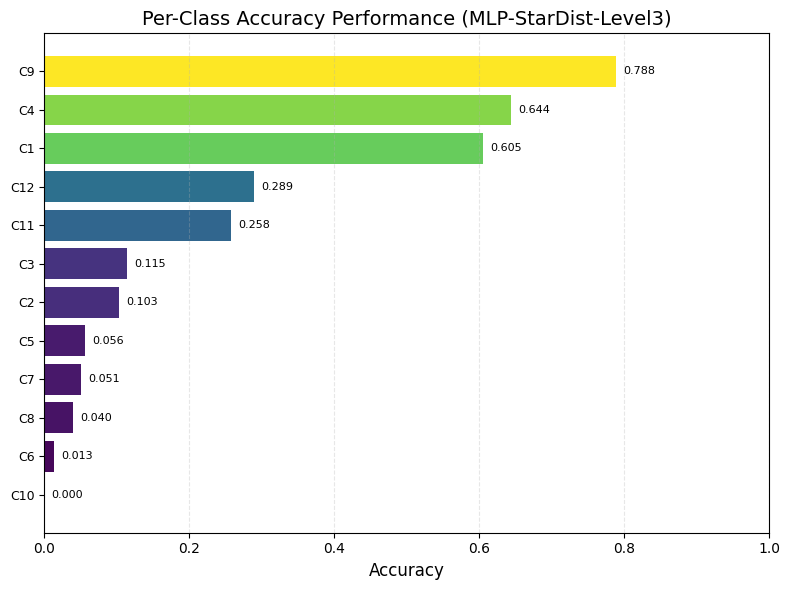


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 12
  Actual classes in test set: 12
  Model parameters: 1,729,358
  Test Accuracy: 0.5470
  Test Macro F1: 0.2555
  Test Weighted F1: 0.5079
Saved: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/acc_level3_stardist.pdf

L4 TNiche (StarDist): acc=0.5251, macro_f1=0.3675
Visualizing per-class accuracy...
  ✓ Computed metrics for 12 classes
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/acc_level4_stardist.pdf


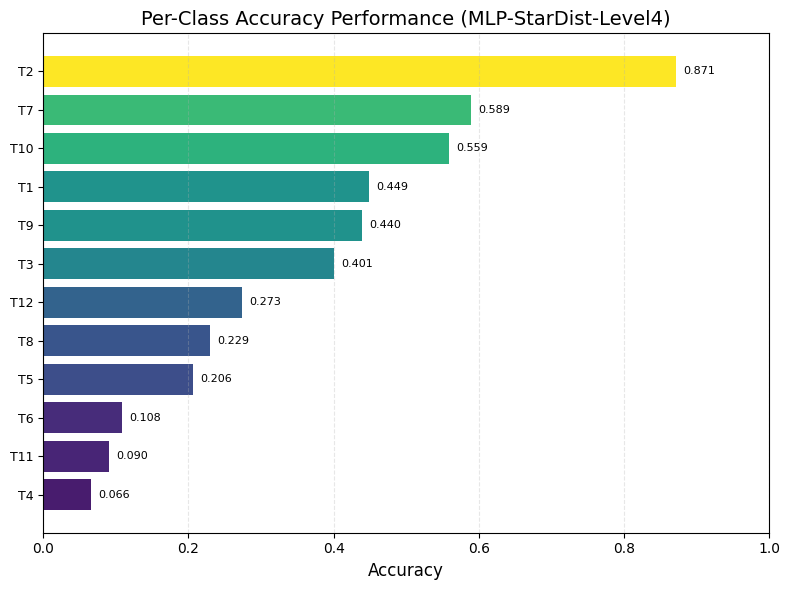


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 12
  Actual classes in test set: 12
  Model parameters: 1,729,358
  Test Accuracy: 0.5251
  Test Macro F1: 0.3675
  Test Weighted F1: 0.5018
Saved: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/acc_level4_stardist.pdf


In [24]:
## StarDist per-class accuracy (run after StarDist evaluate cell)
class_names_star = globals().get("class_names_star")
if class_names_star is None:
    class_names_star = class_names

metrics_acc_star = plot_per_class_accuracy(
    all_labels,
    all_preds,
    class_names_star,
    model=model_star,
    device=device,
    train_dataset=None,
    val_dataset=None,
    input_dim=None,
    best_epoch=None,
    test_acc=all_acc,
    test_macro_f1=all_macro_f1,
    test_weighted_f1=all_weighted_f1,
    model_name="MLP-StarDist-Level2",
    y_sort_by="acc_asc",
    save_path=result_fig("acc_level2_stardist"),
)
print(f"Saved: {result_fig('acc_level2_stardist')}")

metrics_acc_star_l1 = plot_level1_accuracy_from_level2_predictions(
    matched_features_path=matched_features_stardist_path,
    all_preds=all_preds,
    class_names=class_names_star,
    class_names_level1=class_names_level1,
    y_encoded_f=y_encoded_f,
    y_level1_encoded_f=y_level1_encoded_f,
    plot_per_class_accuracy=plot_per_class_accuracy,
    model=model_star,
    device=device,
    model_name="MLP-StarDist-Level1",
    y_sort_by="acc_asc",
    save_path=result_fig("acc_level1_stardist"),
)
if metrics_acc_star_l1 is not None:
    print(f"Saved: {result_fig('acc_level1_stardist')}")

metrics_acc_star_l1_head = plot_level1_accuracy_from_level1_head(
    matched_features_path=matched_features_stardist_path,
    model=model_star,
    device=device,
    scaler=scaler,
    class_names_level1=class_names_level1,
    plot_per_class_accuracy=plot_per_class_accuracy,
    train_dataset=None,
    val_dataset=None,
    input_dim=None,
    best_epoch=None,
    model_name="MLP-StarDist-Level1-head",
    y_sort_by="acc_asc",
    save_path=result_fig("acc_level1_stardist_L1head"),
)
if metrics_acc_star_l1_head is not None:
    print(f"Saved: {result_fig('acc_level1_stardist_L1head')}")

if not hasattr(model_star, "level12_head"):
    print("Skip StarDist L12/L3/L4 per-class accuracy: model_star is not five-head.")
else:
    _star_heads = stardist_head_preds(model_star, scaler, X_star, device, predict_all_label_heads)
    plot_stardist_acc_extra(plot_per_class_accuracy, result_fig, model_star, device, _star_heads, cv_data if "cv_data" in globals() else None, globals())


Computing confusion matrix...
  ⚠ Excluding 1 samples with out-of-range labels/preds (valid class indices: 0–43).
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/conf_matrix_level2_stardist.pdf


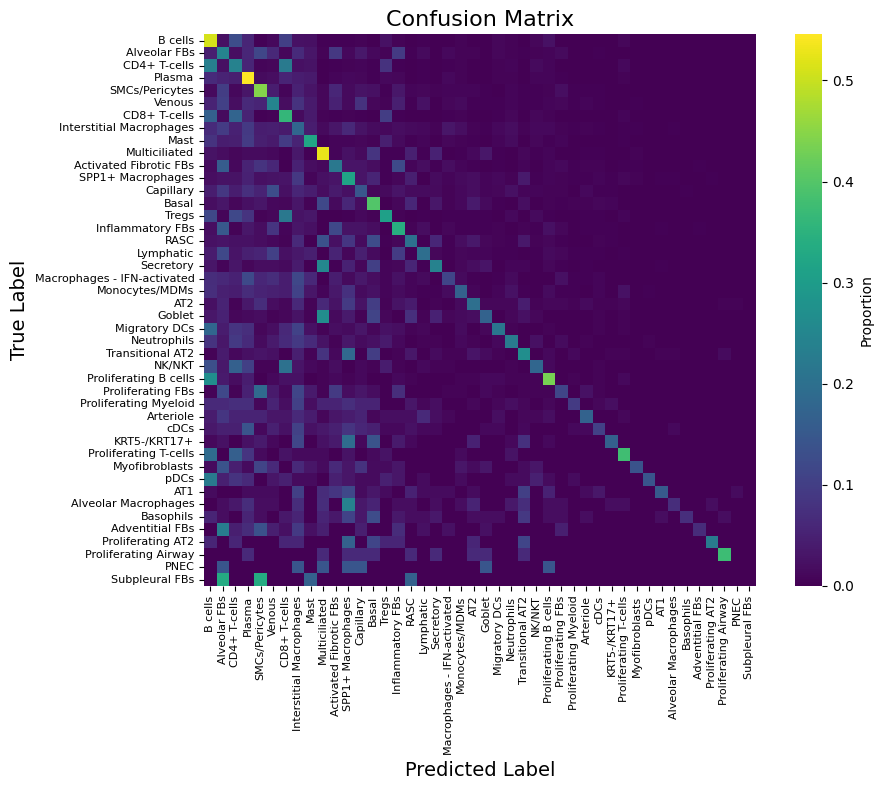

Computing confusion matrix...
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/conf_matrix_level1_stardist.pdf


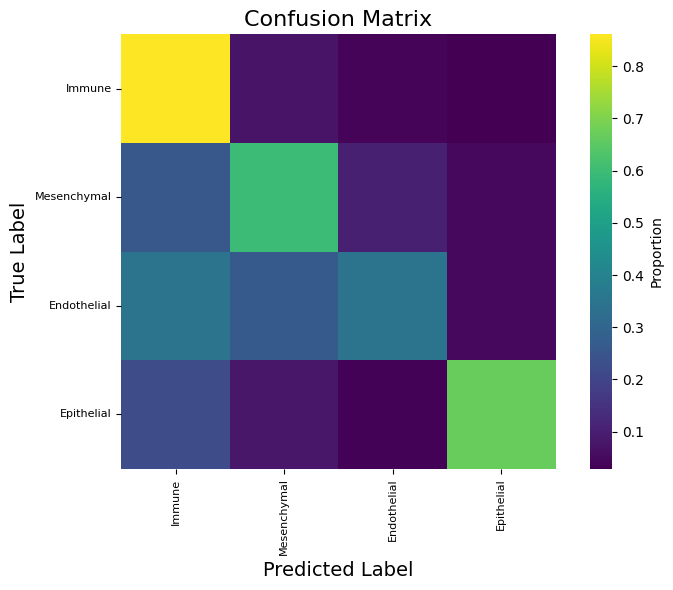


L12 sublineage (StarDist) confusion matrix
Computing confusion matrix...
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/conf_matrix_level12_stardist.pdf


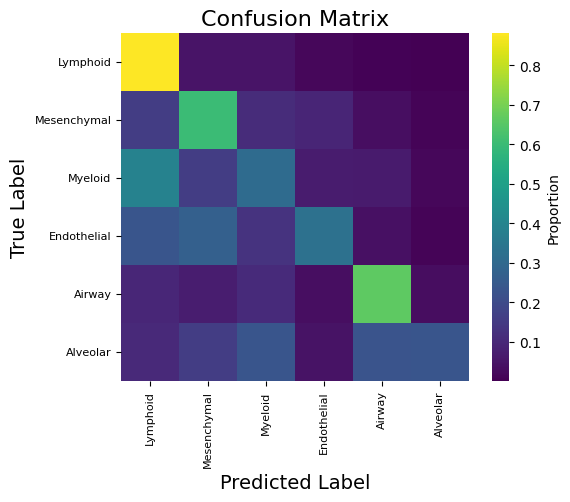

Saved: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/conf_matrix_level12_stardist.pdf

L3 CNiche (StarDist) confusion matrix
Computing confusion matrix...
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/conf_matrix_level3_stardist.pdf


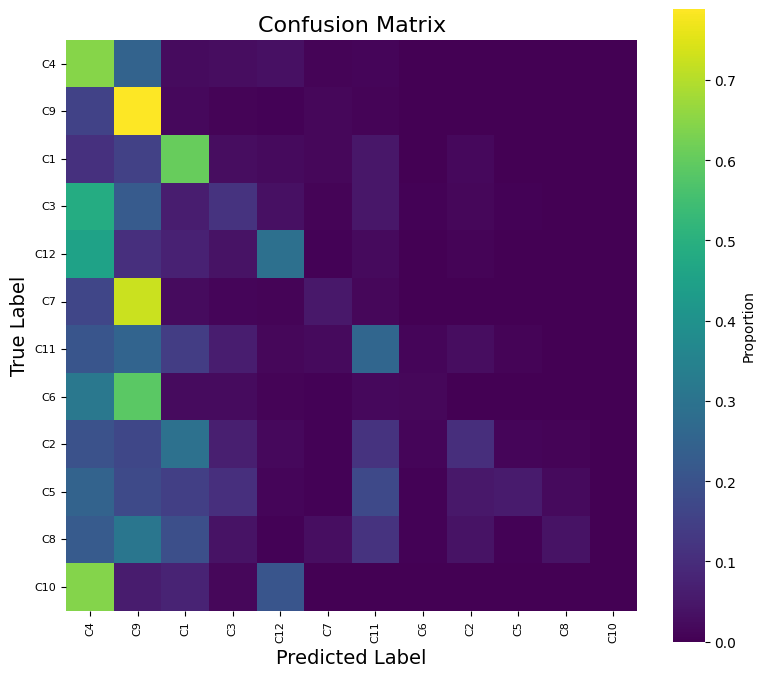

Saved: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/conf_matrix_level3_stardist.pdf

L4 TNiche (StarDist) confusion matrix
Computing confusion matrix...
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/conf_matrix_level4_stardist.pdf


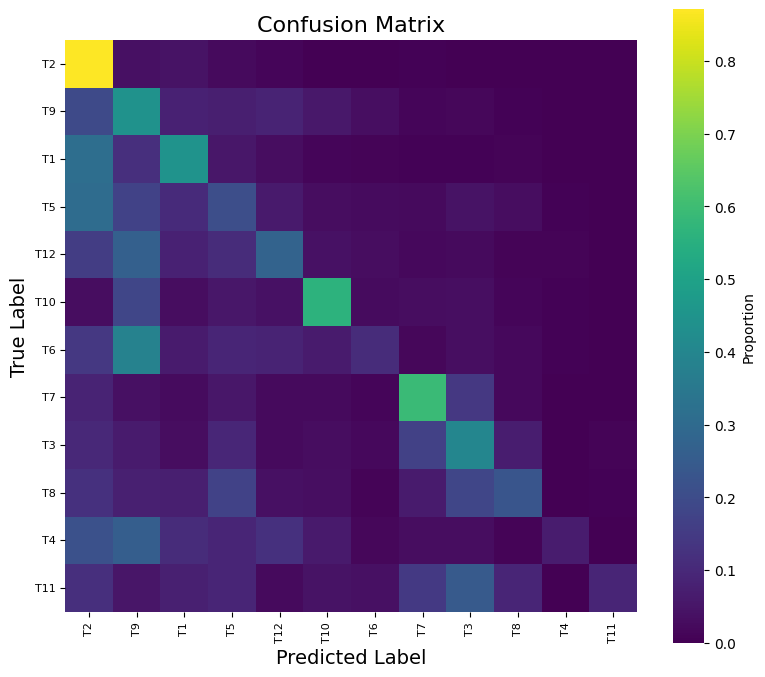

Saved: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/conf_matrix_level4_stardist.pdf


In [25]:
# StarDist prediction heatmaps (confusion matrices): level2 + level1
class_names_star = globals().get("class_names_star")
if class_names_star is None:
    class_names_star = class_names

plot_confusion_matrix(
    all_labels,
    all_preds,
    class_names_star,
    figsize=(10, 8),
    save_path=result_fig("conf_matrix_level2_stardist"),
)

_loaded_star = load_matched_features_bundle(matched_features_stardist_path)
if "y_level1" in _loaded_star:
    _preds_arr = np.asarray(all_preds, dtype=np.int64)
    _n = min(len(_preds_arr), len(_loaded_star["y_level1"]))
    _preds_arr = _preds_arr[:_n]
    _y_true_l1_raw = _loaded_star["y_level1"][:_n]
    _l2_ok = (_preds_arr >= 0) & (_preds_arr < len(class_names_star))
    _child_to_parent = np.full(len(class_names_star), -1, dtype=np.int64)
    for _l2, _l1 in zip(y_encoded_f, y_level1_encoded_f):
        _l2_i, _l1_i = int(_l2), int(_l1)
        if _child_to_parent[_l2_i] == -1:
            _child_to_parent[_l2_i] = _l1_i
    _preds_l1 = _child_to_parent[_preds_arr[_l2_ok]]
    _y_true_l1_raw = _y_true_l1_raw[_l2_ok]

    if getattr(_y_true_l1_raw, "dtype", None) is not None and _y_true_l1_raw.dtype.kind in ["U", "S", "O"]:
        _name_to_idx = {str(c): i for i, c in enumerate(class_names_level1)}
        _y_true_l1 = np.array([_name_to_idx.get(str(v), -1) for v in _y_true_l1_raw], dtype=np.int64)
    else:
        _y_true_l1 = np.asarray(_y_true_l1_raw, dtype=np.int64)

    _n = min(len(_y_true_l1), len(_preds_l1))
    _y_true_l1 = _y_true_l1[:_n]
    _preds_l1 = _preds_l1[:_n]
    _valid = _y_true_l1 >= 0

    if np.any(_valid):
        plot_confusion_matrix(
            _y_true_l1[_valid],
            _preds_l1[_valid],
            class_names_level1,
            figsize=(8, 6),
            save_path=result_fig("conf_matrix_level1_stardist"),
            # save_path=f'{therapy_data}/{therapy_model}/{save_result}/conf_matrix_tumor1_level1_stardist_hce.pdf',
        )
    else:
        print("Skip level1 StarDist confusion matrix: no valid y_level1 labels.")
else:
    print(f"Skip level1 StarDist confusion matrix: y_level1 not found in {matched_features_stardist_path}")

if not hasattr(model_star, "level12_head"):
    print("Skip StarDist L12/L3/L4 confusion matrices: model_star is not five-head.")
else:
    _star_heads = stardist_head_preds(model_star, scaler, X_star, device, predict_all_label_heads)
    plot_stardist_confusion_extra(plot_confusion_matrix, result_fig, _star_heads, cv_data if "cv_data" in globals() else None, globals())


Visualizing per-class performance...
  ⚠ Excluding 1 samples with out-of-range labels/preds (valid class indices: 0–43).
  ✓ Computed metrics for 44 classes
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/f1_level2_stardist.pdf


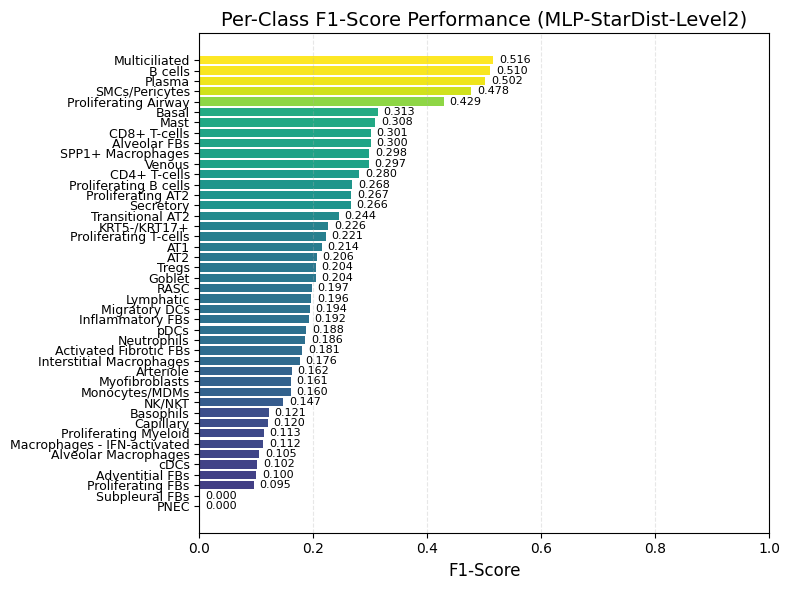


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 44
  Actual classes in test set: 44
  Model parameters: 1,729,358
  Test Accuracy: 0.3331
  Test Macro F1: 0.2241
  Test Weighted F1: 0.3353
  Level1 F1 plot from level2 preds (same mapping as accuracy helper): acc=0.7257, macro_f1=0.6234, weighted_f1=0.7195
Visualizing per-class performance...
  ✓ Computed metrics for 4 classes
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/f1_level1_stardist.pdf


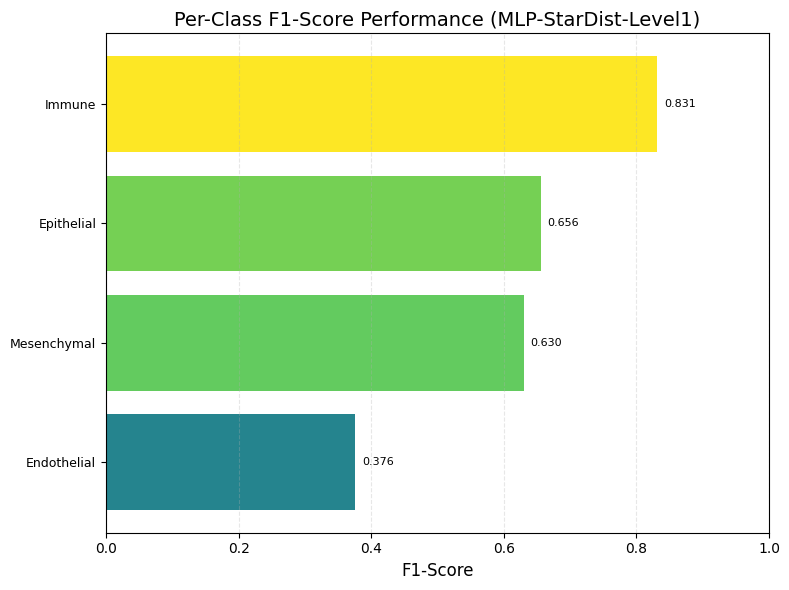


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 4
  Actual classes in test set: 4
  Model parameters: 1,729,358
  Test Accuracy: 0.7257
  Test Macro F1: 0.6234
  Test Weighted F1: 0.7195
  Level1 F1 plot from L1 head: acc=0.7222, macro_f1=0.6241, weighted_f1=0.7198
Visualizing per-class performance...
  ✓ Computed metrics for 4 classes
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/f1_level1_stardist_L1head.pdf


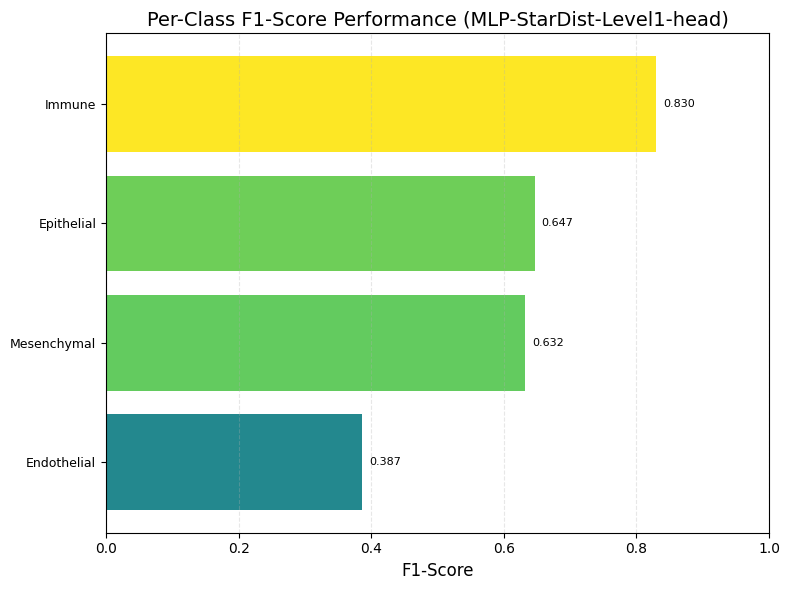


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 4
  Actual classes in test set: 4
  Model parameters: 1,729,358
  Test Accuracy: 0.7222
  Test Macro F1: 0.6241
  Test Weighted F1: 0.7198

L12 sublineage (StarDist) per-class F1
Visualizing per-class performance...
  ✓ Computed metrics for 6 classes
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/f1_level12_stardist.pdf


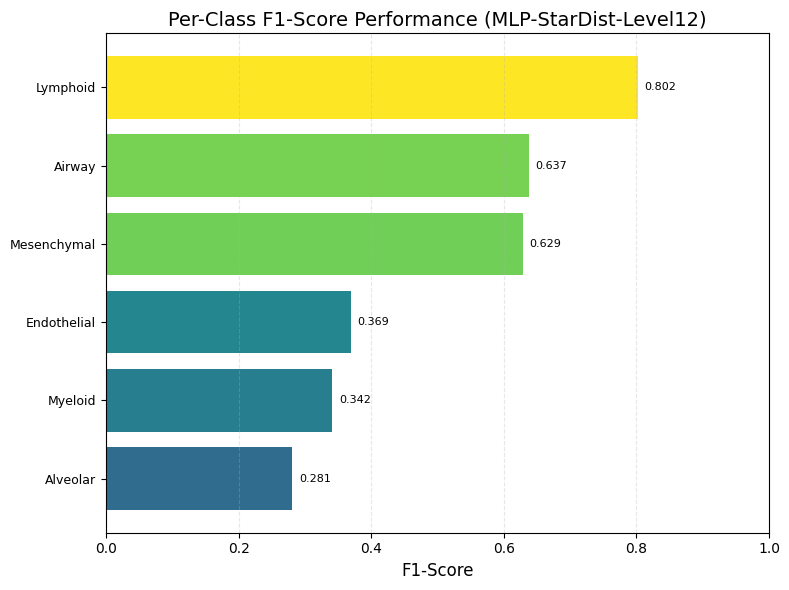


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 6
  Actual classes in test set: 6
  Model parameters: 1,729,358
  Test Accuracy: 0.6413
  Test Macro F1: 0.5100
  Test Weighted F1: 0.6254
Saved: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/f1_level12_stardist.pdf

L3 CNiche (StarDist) per-class F1
Visualizing per-class performance...
  ✓ Computed metrics for 12 classes
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/f1_level3_stardist.pdf


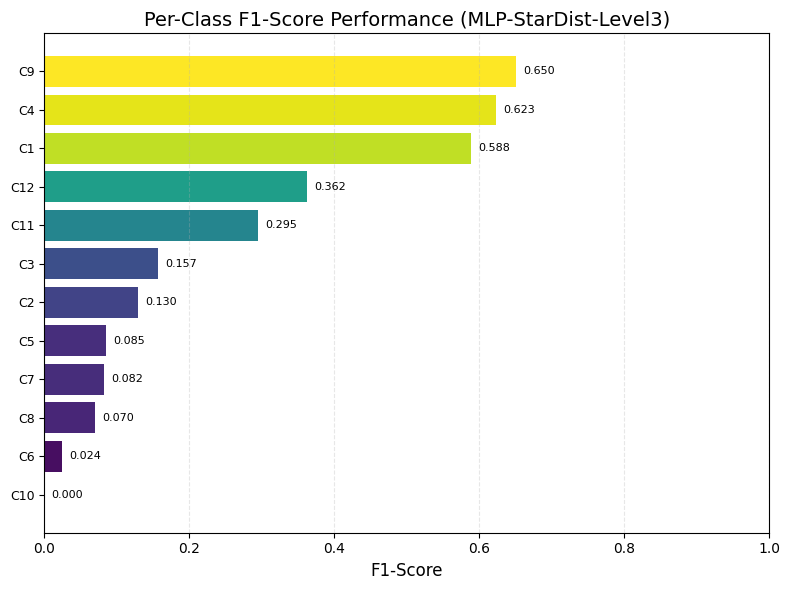


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 12
  Actual classes in test set: 12
  Model parameters: 1,729,358
  Test Accuracy: 0.5470
  Test Macro F1: 0.2555
  Test Weighted F1: 0.5079
Saved: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/f1_level3_stardist.pdf

L4 TNiche (StarDist) per-class F1
Visualizing per-class performance...
  ✓ Computed metrics for 12 classes
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/f1_level4_stardist.pdf


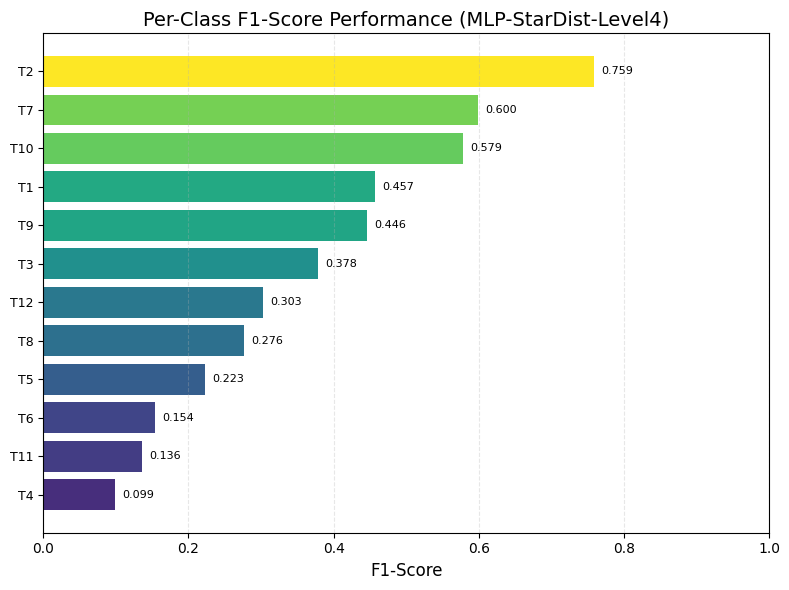


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 12
  Actual classes in test set: 12
  Model parameters: 1,729,358
  Test Accuracy: 0.5251
  Test Macro F1: 0.3675
  Test Weighted F1: 0.5018
Saved: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/f1_level4_stardist.pdf


In [26]:
class_names_star = globals().get("class_names_star")
if class_names_star is None:
    class_names_star = class_names

metrics_f1_star = plot_per_class_f1(
    all_labels,
    all_preds,
    class_names_star,
    model=model_star,
    device=device,
    train_dataset=None,
    val_dataset=None,
    input_dim=None,
    best_epoch=None,
    test_acc=all_acc,
    test_macro_f1=all_macro_f1,
    test_weighted_f1=all_weighted_f1,
    y_sort_by="f1_asc",
    model_name="MLP-StarDist-Level2",
    save_path=result_fig("f1_level2_stardist"),
)

metrics_f1_star_l1 = plot_level1_f1_from_level2_predictions(
    matched_features_path=matched_features_stardist_path,
    all_preds=all_preds,
    class_names=class_names_star,
    class_names_level1=class_names_level1,
    y_encoded_f=y_encoded_f,
    y_level1_encoded_f=y_level1_encoded_f,
    plot_per_class_f1=plot_per_class_f1,
    model=model_star,
    device=device,
    y_sort_by="f1_asc",
    model_name="MLP-StarDist-Level1",
    save_path=result_fig("f1_level1_stardist"),
)

metrics_f1_star_l1_head = plot_level1_f1_from_level1_head(
    matched_features_path=matched_features_stardist_path,
    model=model_star,
    device=device,
    scaler=scaler,
    class_names_level1=class_names_level1,
    plot_per_class_f1=plot_per_class_f1,
    train_dataset=None,
    val_dataset=None,
    input_dim=None,
    best_epoch=None,
    y_sort_by="f1_asc",
    model_name="MLP-StarDist-Level1-head",
    save_path=result_fig("f1_level1_stardist_L1head"),
)

if not hasattr(model_star, "level12_head"):
    print("Skip StarDist L12/L3/L4 per-class F1: model_star is not five-head.")
else:
    _star_heads = stardist_head_preds(model_star, scaler, X_star, device, predict_all_label_heads)
    plot_stardist_f1_extra(plot_per_class_f1, result_fig, model_star, device, _star_heads, cv_data if "cv_data" in globals() else None, globals())


  Excluding 1 StarDist cells whose final_CT is absent from training class_names (44 classes) for ROC.
  ROC colors: xenium_ct (aligned with Xenium spatial palette).
  ✓ Saved ROC figure: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/roc_stardist_level2.pdf


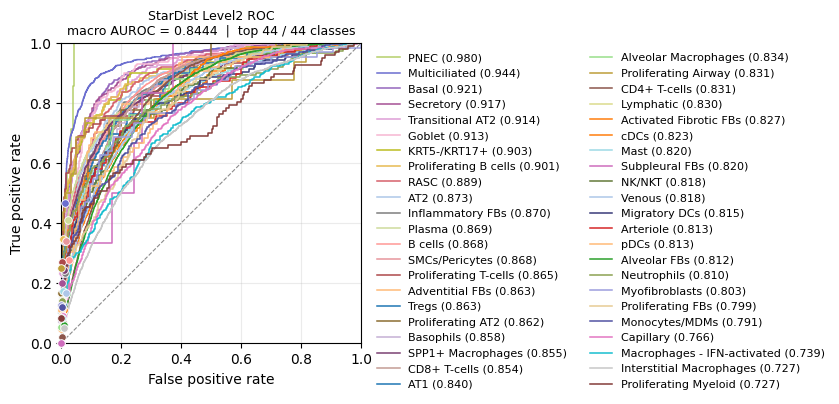

  ROC colors: xenium_lineage (aligned with Xenium spatial palette).
  ✓ Saved ROC figure: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/roc_stardist_level1.pdf


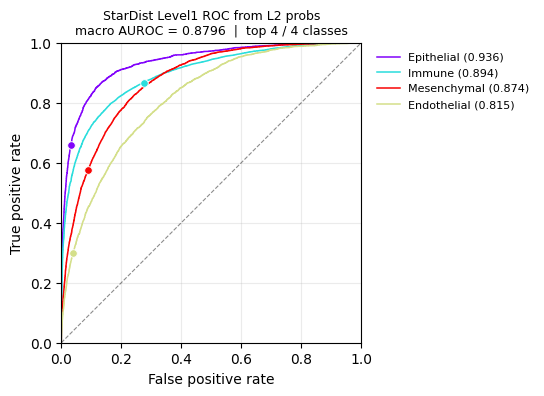

  ROC colors: xenium_lineage (aligned with Xenium spatial palette).
  ✓ Saved ROC figure: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/roc_stardist_level1_L1head.pdf


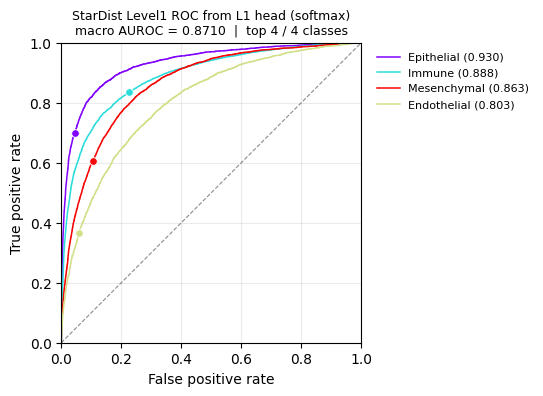


L12 sublineage (StarDist) ROC
  ROC colors: xenium_auto (aligned with Xenium spatial palette).
  ✓ Saved ROC figure: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/roc_stardist_level12.pdf


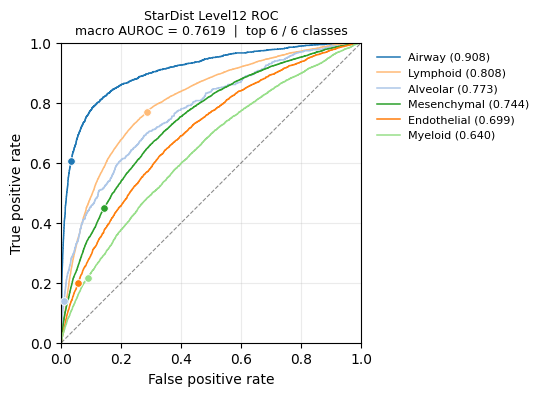

Saved: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/roc_stardist_level12.pdf

L3 CNiche (StarDist) ROC
  ROC colors: xenium_auto (aligned with Xenium spatial palette).
  ✓ Saved ROC figure: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/roc_stardist_level3.pdf


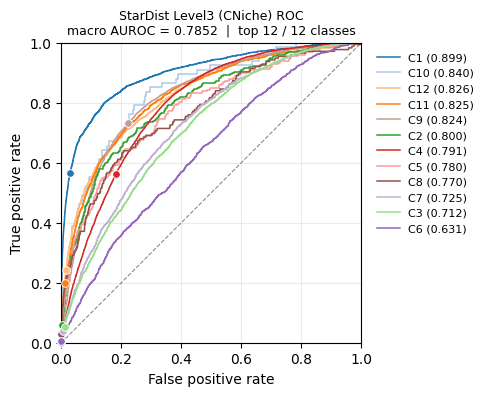

Saved: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/roc_stardist_level3.pdf

L4 TNiche (StarDist) ROC
  ROC colors: xenium_auto (aligned with Xenium spatial palette).
  ✓ Saved ROC figure: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/roc_stardist_level4.pdf


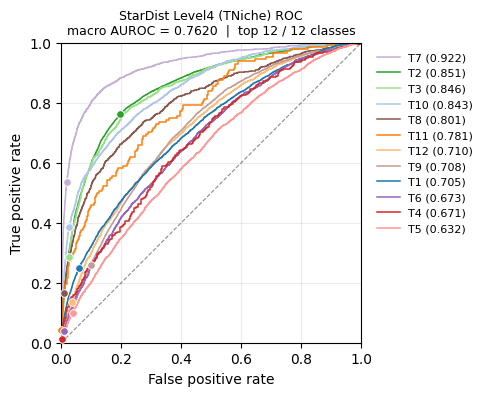

Saved: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/result/roc_stardist_level4.pdf


In [27]:
import numpy as np

class_names_star = globals().get("class_names_star")
if class_names_star is None:
    class_names_star = class_names

_z = load_matched_features_bundle(matched_features_stardist_path)
X_star_scaled = scaler.transform(_z["X"])
probs_l2 = mlp_collect_softmax_probs(model_star, X_star_scaled, device)

# Full-length five-head softmax for metrics CSV (ROC plots use valid subset below).
_probs_heads = None
if hasattr(model_star, "level12_head"):
    _probs_heads = mlp_collect_five_head_softmax_probs(model_star, X_star_scaled, device)

# Encode y from the same bundle as probs (training class_names indices; unknown CT → -1).
if "y" not in _z:
    print("Skip ROC: no y in matched features bundle.")
else:
    y_roc = encode_labels_with_class_names(_z["y"], class_names_star)
    m = min(len(probs_l2), len(y_roc))
    probs_m = probs_l2[:m]
    y_m = y_roc[:m]
    valid = (y_m >= 0) & (y_m < len(class_names_star))
    n_bad = int((~valid).sum())
    if n_bad:
        print(
            f"  Excluding {n_bad} StarDist cells whose final_CT is absent from "
            f"training class_names ({len(class_names_star)} classes) for ROC."
        )
    if not np.any(valid):
        print("Skip ROC: no valid training-aligned labels.")
    else:
        _y_l1_roc = _z["y_level1"][:m][valid] if "y_level1" in _z else None
        _X_roc = X_star_scaled[:m][valid]
        _probs_roc = probs_m[valid]
        _y_roc = y_m[valid]

        roc_info_l2 = plot_multiclass_roc_curves(
            _y_roc,
            _probs_roc,
            class_names_star,
            figsize=(3.0, 3.0),
            max_curves=len(class_names_star),
            save_path=result_fig("roc_stardist_level2"),
            title="StarDist Level2 ROC",
            roc_color_scheme="xenium_ct",
        )
        roc_info_l1 = plot_level1_roc_from_level2_scores(
            matched_features_stardist_path,
            _probs_roc,
            class_names_star,
            class_names_level1,
            y_encoded_f,
            y_level1_encoded_f,
            figsize=(3.0, 3.0),
            save_path=result_fig("roc_stardist_level1"),
            title="StarDist Level1 ROC from L2 probs",
            roc_color_scheme="xenium_lineage",
            y_level1_f=_y_l1_roc,
        )

        roc_info_l1_head = plot_level1_roc_from_level1_head(
            matched_features_stardist_path,
            model_star,
            device,
            scaler,
            class_names_level1,
            figsize=(3.0, 3.0),
            save_path=result_fig("roc_stardist_level1_L1head"),
            title="StarDist Level1 ROC from L1 head (softmax)",
            roc_color_scheme="xenium_lineage",
            X_f=_X_roc,
            y_level1_f=_y_l1_roc,
        )
        if hasattr(model_star, "level12_head"):
            _probs_heads_roc = {k: v[:m][valid] for k, v in _probs_heads.items()}
            plot_stardist_roc_extra(
                plot_multiclass_roc_curves,
                result_fig,
                _probs_heads_roc,
                cv_data if "cv_data" in globals() else None,
                len(_y_roc),
                globals(),
            )
        else:
            print("Skip StarDist L12/L3/L4 ROC: model_star is not five-head.")


In [33]:
## Save StarDist external validation metrics (matched h5ad; mirrors validation_internal_metrics.csv)
import importlib
import xenium_uni_nb_helpers as uni_nb
importlib.reload(uni_nb)
from xenium_uni_nb_helpers import (
    save_stardist_external_validation_metrics,
    plot_stardist_roc_from_auroc_csv,
    _auroc_csv_path_from_metrics,
)

class_names_star = globals().get("class_names_star")
if class_names_star is None:
    class_names_star = class_names

if "all_preds" not in globals() or "matched_features_stardist_path" not in globals():
    raise NameError("Run StarDist evaluate / per-class accuracy cells first.")

logo_summary = globals().get("logo_summary")
if logo_summary is None and isinstance(globals().get("LP"), dict):
    logo_summary = LP.get("logo_summary")

# Reuse ROC softmax if the ROC cell ran first (avoids a second forward pass).
_probs_l2 = globals().get("probs_l2")
_head_probs = globals().get("_probs_heads")

metrics_df, combined_df, tier_aucs = save_stardist_external_validation_metrics(
    all_labels=all_labels,
    all_preds=all_preds,
    matched_features_path=matched_features_stardist_path,
    class_names_star=class_names_star,
    class_names_level1=class_names_level1,
    y_encoded_f=y_encoded_f,
    y_level1_encoded_f=y_level1_encoded_f,
    therapy_data=therapy_data,
    metrics_csv_path=result_fig("validation_external_stardist_matched_metrics"),
    model_star=model_star if "model_star" in globals() else None,
    scaler=scaler,
    X_star=X_star if "X_star" in globals() else None,
    device=device,
    predict_all_label_heads=predict_all_label_heads,
    cv_data=cv_data if "cv_data" in globals() else None,
    g=globals(),
    logo_summary=logo_summary,
    hce_w1=globals().get("hce_w1", 1.0),
    hce_w2=globals().get("hce_w2", 1.0),
    hce_w12=globals().get("hce_w12", 2.0),
    hce_w_l12head=globals().get("hce_w_l12head", 1.0),
    hce_w_l3=globals().get("hce_w_l3", 1.0),
    hce_w_l4=globals().get("hce_w_l4", 1.0),
    probs_l2=_probs_l2,
    head_probs=_head_probs,
)

print("\nStarDist matched per-tier columns (insample_* = StarDist-matched cells, best-fold model):")
_tier_cols = [
    c for c in combined_df.columns
    if c.startswith(("insample_", "num_", "val_")) and ("auc" in c or not c.endswith("_std"))
]
print(combined_df[_tier_cols].tail(1).T)
print("\nMacro AUROC by tier:")
for _t, _v in sorted(tier_aucs.items()):
    print(f"  {_t}: {_v:.4f}")

_auroc_csv = _auroc_csv_path_from_metrics(result_fig("validation_external_stardist_matched_metrics"))
print(f"\nLevel2 AUROC table: {_auroc_csv}")


Current run metrics:
             timestamp                 therapy_data  best_epoch hce_lambda  \
0  2026-06-24 18:41:07  VUILD107MA_stardist_matched           0       None   

   hce_w1  hce_w2  hce_w12  hce_w_l12head  hce_w_l3  hce_w_l4  ...  \
0     1.0     2.0      1.0            1.0       1.0       1.0  ...   

   num_l3_classes  num_l4_classes  insample_l2_macro_auc  \
0              12              12               0.844396   

   insample_l1_macro_auc  insample_l1_head_macro_auc  insample_l12_macro_auc  \
0               0.879618                    0.870969                0.855079   

   insample_l3_macro_auc  insample_l4_macro_auc  val_l2_macro_auc  \
0               0.803303               0.838322          0.844396   

   val_l1_macro_auc  
0          0.879618  

[1 rows x 48 columns]

Saved comparison table to: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/Xemiun/weiqin/SpatialPF-NGenetics/Spatial-PF-Processed/Data/Complete_Cases/VUILD107MA/VUILD107MA_project_all_UNI/res

In [ ]:
## Replay Level2 ROC from validation_external_stardist_matched_AUROC.csv
# import importlib
# import xenium_uni_nb_helpers as uni_nb
# importlib.reload(uni_nb)
# from pathlib import Path
# from xenium_uni_nb_helpers import plot_stardist_roc_from_auroc_csv, _auroc_csv_path_from_metrics

# class_names_star = globals().get("class_names_star")
# if class_names_star is None:
#     class_names_star = class_names
# _auroc_csv = _auroc_csv_path_from_metrics(
#     result_fig("validation_external_stardist_matched_metrics")
# )
# if not Path(_auroc_csv).is_file():
#     raise FileNotFoundError(f"Run metrics cell first: {_auroc_csv}")

# roc_info_l2_csv = plot_stardist_roc_from_auroc_csv(
#     _auroc_csv,
#     class_names_star,
#     save_path=result_fig("roc_stardist_level2_from_AUROC_csv"),
#     title="StarDist Level2 ROC (from AUROC CSV)",
#     roc_color_scheme="xenium_ct",
# )
# if roc_info_l2_csv:
#     print(f"Macro AUROC from CSV: {roc_info_l2_csv['macro_auc']:.4f}")
